In [1]:
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

%matplotlib inline
%config InlineBackend.figure_format='retina'

# load open data

In [2]:
hcp_open_data = r'E:\gregn\data\HCP\HCP_OPEN.h5'
hcp_open = pd.read_hdf(hcp_open_data, 'hcp_open')
hcp_open = hcp_open.set_index(['Subject'])
print('HCP OPEN\nrows: {}\ncols:  {}'.format(hcp_open.shape[0], hcp_open.shape[1]))
print('\ndata type value counts:')
print(hcp_open.dtypes.value_counts())

HCP OPEN
rows: 1206
cols:  581

data type value counts:
float64    427
object      78
bool        48
int64       28
dtype: int64


# load restricted data

In [3]:
hcp_restricted_data = r'E:\gregn\data\HCP\HCP_RESTRICTED.h5'
hcp_restricted = pd.read_hdf(hcp_restricted_data, 'hcp_restricted')
hcp_restricted = hcp_restricted.set_index(['Subject'])
print('HCP RESTRICTED\nrows: {}\ncols:  {}'.format(hcp_restricted.shape[0], hcp_restricted.shape[1]))
print('\ndata type value counts:')
print(hcp_restricted.dtypes.value_counts())

HCP RESTRICTED
rows: 1206
cols:  200

data type value counts:
float64    177
bool         9
object       8
int64        6
dtype: int64


# join data

In [4]:
hcp = hcp_open.join(hcp_restricted)
print('HCP \nrows: {}\ncols:  {}'.format(hcp.shape[0], hcp.shape[1]))
print('\ndata type value counts:')
print(hcp.dtypes.value_counts())

HCP 
rows: 1206
cols:  781

data type value counts:
float64    604
object      86
bool        57
int64       34
dtype: int64


In [5]:
hcp = hcp.dropna(subset=['FS_IntraCranial_Vol'])

In [6]:
# change to datetime format 
hcp['PSQI_GetUpTime'] = pd.to_datetime(hcp['PSQI_GetUpTime']).dt.hour
hcp['PSQI_BedTime'] = pd.to_datetime(hcp['PSQI_BedTime']).dt.hour

# get dummies

In [7]:
hcp = pd.get_dummies(hcp, columns=[
    'Gender', 
    'Race', 
    'Ethnicity', 
    'ZygositySR', 
    'ZygosityGT'
])
list(hcp.select_dtypes(include='uint8').columns)

['Gender_F',
 'Gender_M',
 'Race_Am. Indian/Alaskan Nat.',
 'Race_Asian/Nat. Hawaiian/Othr Pacific Is.',
 'Race_Black or African Am.',
 'Race_More than one',
 'Race_Unknown or Not Reported',
 'Race_White',
 'Ethnicity_Hispanic/Latino',
 'Ethnicity_Not Hispanic/Latino',
 'Ethnicity_Unknown or Not Reported',
 'ZygositySR_ ',
 'ZygositySR_MZ',
 'ZygositySR_NotMZ',
 'ZygositySR_NotTwin',
 'ZygosityGT_ ',
 'ZygosityGT_DZ',
 'ZygosityGT_MZ']

# y target variable

In [8]:
hcp = hcp.dropna(subset=['SSAGA_Mj_Times_Used'])

y = hcp['SSAGA_Mj_Times_Used'].values
y = np.where(y==1, 0, y)
y = np.where(y==2, 0, y)
y = np.where(y==3, 0, y)
y = np.where(y==4, 1, y)
y = np.where(y==5, 1, y)

unique, counts, = np.unique(y, return_counts=True)

print('100x binary classification counts')
print('[0] used less than or equal to 100x:    ', counts[0])
print('[1] used more than 100x:                ', counts[1])

print('\n\noriginal marijuana times used class counts:\n')
print(hcp['SSAGA_Mj_Times_Used'].value_counts())

100x binary classification counts
[0] used less than or equal to 100x:     939
[1] used more than 100x:                 172


original marijuana times used class counts:

0.0    503
1.0    225
3.0    128
5.0    100
2.0     83
4.0     72
Name: SSAGA_Mj_Times_Used, dtype: int64


# X features

In [9]:
X = hcp
X = X[[
 'FS_IntraCranial_Vol',
 'FS_BrainSeg_Vol',
 'FS_BrainSeg_Vol_No_Vent',
 'FS_BrainSeg_Vol_No_Vent_Surf',
 'FS_LCort_GM_Vol',
 'FS_RCort_GM_Vol',
 'FS_TotCort_GM_Vol',
 'FS_SubCort_GM_Vol',
 'FS_Total_GM_Vol',
 'FS_SupraTentorial_Vol',
 'FS_L_WM_Vol',
 'FS_R_WM_Vol',
 'FS_Tot_WM_Vol',
 'FS_Mask_Vol',
 'FS_BrainSegVol_eTIV_Ratio',
 'FS_MaskVol_eTIV_Ratio',
 'FS_LH_Defect_Holes',
 'FS_RH_Defect_Holes',
 'FS_Total_Defect_Holes',
 'FS_L_LatVent_Vol',
 'FS_L_InfLatVent_Vol',
 'FS_L_Cerebellum_WM_Vol',
 'FS_L_Cerebellum_Cort_Vol',
 'FS_L_ThalamusProper_Vol',
 'FS_L_Caudate_Vol',
 'FS_L_Putamen_Vol',
 'FS_L_Pallidum_Vol',
 'FS_3rdVent_Vol',
 'FS_4thVent_Vol',
 'FS_BrainStem_Vol',
 'FS_L_Hippo_Vol',
 'FS_L_Amygdala_Vol',
 'FS_CSF_Vol',
 'FS_L_AccumbensArea_Vol',
 'FS_L_VentDC_Vol',
 'FS_L_Vessel_Vol',
 'FS_L_ChoroidPlexus_Vol',
 'FS_R_LatVent_Vol',
 'FS_R_InfLatVent_Vol',
 'FS_R_Cerebellum_WM_Vol',
 'FS_R_Cerebellum_Cort_Vol',
 'FS_R_ThalamusProper_Vol',
 'FS_R_Caudate_Vol',
 'FS_R_Putamen_Vol',
 'FS_R_Pallidum_Vol',
 'FS_R_Hippo_Vol',
 'FS_R_Amygdala_Vol',
 'FS_R_AccumbensArea_Vol',
 'FS_R_VentDC_Vol',
 'FS_R_Vessel_Vol',
 'FS_R_ChoroidPlexus_Vol',
 'FS_5thVent_Vol',
 'FS_WM_Hypointens_Vol',
 'FS_L_WM_Hypointens_Vol',
 'FS_R_WM_Hypointens_Vol',
 'FS_L_Non-WM_Hypointens_Vol',
 'FS_R_Non-WM_Hypointens_Vol',
 'FS_OpticChiasm_Vol',
 'FS_CC_Posterior_Vol',
 'FS_CC_MidPosterior_Vol',
 'FS_CC_Central_Vol',
 'FS_CC_MidAnterior_Vol',
 'FS_CC_Anterior_Vol',
 'FS_L_Bankssts_Thck',
 'FS_L_Caudalanteriorcingulate_Thck',
 'FS_L_Caudalmiddlefrontal_Thck',
 'FS_L_Cuneus_Thck',
 'FS_L_Entorhinal_Thck',
 'FS_L_Fusiform_Thck',
 'FS_L_Inferiorparietal_Thck',
 'FS_L_Inferiortemporal_Thck',
 'FS_L_Isthmuscingulate_Thck',
 'FS_L_Lateraloccipital_Thck',
 'FS_L_Lateralorbitofrontal_Thck',
 'FS_L_Lingual_Thck',
 'FS_L_Medialorbitofrontal_Thck',
 'FS_L_Middletemporal_Thck',
 'FS_L_Parahippocampal_Thck',
 'FS_L_Paracentral_Thck',
 'FS_L_Parsopercularis_Thck',
 'FS_L_Parsorbitalis_Thck',
 'FS_L_Parstriangularis_Thck',
 'FS_L_Pericalcarine_Thck',
 'FS_L_Postcentral_Thck',
 'FS_L_Posteriorcingulate_Thck',
 'FS_L_Precentral_Thck',
 'FS_L_Precuneus_Thck',
 'FS_L_Rostralanteriorcingulate_Thck',
 'FS_L_Rostralmiddlefrontal_Thck',
 'FS_L_Superiorfrontal_Thck',
 'FS_L_Superiorparietal_Thck',
 'FS_L_Superiortemporal_Thck',
 'FS_L_Supramarginal_Thck',
 'FS_L_Frontalpole_Thck',
 'FS_L_Temporalpole_Thck',
 'FS_L_Transversetemporal_Thck',
 'FS_L_Insula_Thck',
 'FS_R_Bankssts_Thck',
 'FS_R_Caudalanteriorcingulate_Thck',
 'FS_R_Caudalmiddlefrontal_Thck',
 'FS_R_Cuneus_Thck',
 'FS_R_Entorhinal_Thck',
 'FS_R_Fusiform_Thck',
 'FS_R_Inferiorparietal_Thck',
 'FS_R_Inferiortemporal_Thck',
 'FS_R_Isthmuscingulate_Thck',
 'FS_R_Lateraloccipital_Thck',
 'FS_R_Lateralorbitofrontal_Thck',
 'FS_R_Lingual_Thck',
 'FS_R_Medialorbitofrontal_Thck',
 'FS_R_Middletemporal_Thck',
 'FS_R_Parahippocampal_Thck',
 'FS_R_Paracentral_Thck',
 'FS_R_Parsopercularis_Thck',
 'FS_R_Parsorbitalis_Thck',
 'FS_R_Parstriangularis_Thck',
 'FS_R_Pericalcarine_Thck',
 'FS_R_Postcentral_Thck',
 'FS_R_Posteriorcingulate_Thck',
 'FS_R_Precentral_Thck',
 'FS_R_Precuneus_Thck',
 'FS_R_Rostralanteriorcingulate_Thck',
 'FS_R_Rostralmiddlefrontal_Thck',
 'FS_R_Superiorfrontal_Thck',
 'FS_R_Superiorparietal_Thck',
 'FS_R_Superiortemporal_Thck',
 'FS_R_Supramarginal_Thck',
 'FS_R_Frontalpole_Thck',
 'FS_R_Temporalpole_Thck',
 'FS_R_Transversetemporal_Thck',
 'FS_R_Insula_Thck',
 'FS_L_Bankssts_Area',
 'FS_L_Caudalanteriorcingulate_Area',
 'FS_L_Caudalmiddlefrontal_Area',
 'FS_L_Cuneus_Area',
 'FS_L_Entorhinal_Area',
 'FS_L_Fusiform_Area',
 'FS_L_Inferiorparietal_Area',
 'FS_L_Inferiortemporal_Area',
 'FS_L_Isthmuscingulate_Area',
 'FS_L_Lateraloccipital_Area',
 'FS_L_Lateralorbitofrontal_Area',
 'FS_L_Lingual_Area',
 'FS_L_Medialorbitofrontal_Area',
 'FS_L_Middletemporal_Area',
 'FS_L_Parahippocampal_Area',
 'FS_L_Paracentral_Area',
 'FS_L_Parsopercularis_Area',
 'FS_L_Parsorbitalis_Area',
 'FS_L_Parstriangularis_Area',
 'FS_L_Pericalcarine_Area',
 'FS_L_Postcentral_Area',
 'FS_L_Posteriorcingulate_Area',
 'FS_L_Precentral_Area',
 'FS_L_Precuneus_Area',
 'FS_L_Rostralanteriorcingulate_Area',
 'FS_L_Rostralmiddlefrontal_Area',
 'FS_L_Superiorfrontal_Area',
 'FS_L_Superiorparietal_Area',
 'FS_L_Superiortemporal_Area',
 'FS_L_Supramarginal_Area',
 'FS_L_Frontalpole_Area',
 'FS_L_Temporalpole_Area',
 'FS_L_Transversetemporal_Area',
 'FS_L_Insula_Area',
 'FS_R_Bankssts_Area',
 'FS_R_Caudalanteriorcingulate_Area',
 'FS_R_Caudalmiddlefrontal_Area',
 'FS_R_Cuneus_Area',
 'FS_R_Entorhinal_Area',
 'FS_R_Fusiform_Area',
 'FS_R_Inferiorparietal_Area',
 'FS_R_Inferiortemporal_Area',
 'FS_R_Isthmuscingulate_Area',
 'FS_R_Lateraloccipital_Area',
 'FS_R_Lateralorbitofrontal_Area',
 'FS_R_Lingual_Area',
 'FS_R_Medialorbitofrontal_Area',
 'FS_R_Middletemporal_Area',
 'FS_R_Parahippocampal_Area',
 'FS_R_Paracentral_Area',
 'FS_R_Parsopercularis_Area',
 'FS_R_Parsorbitalis_Area',
 'FS_R_Parstriangularis_Area',
 'FS_R_Pericalcarine_Area',
 'FS_R_Postcentral_Area',
 'FS_R_Posteriorcingulate_Area',
 'FS_R_Precentral_Area',
 'FS_R_Precuneus_Area',
 'FS_R_Rostralanteriorcingulate_Area',
 'FS_R_Rostralmiddlefrontal_Area',
 'FS_R_Superiorfrontal_Area',
 'FS_R_Superiorparietal_Area',
 'FS_R_Superiortemporal_Area',
 'FS_R_Supramarginal_Area',
 'FS_R_Frontalpole_Area',
 'FS_R_Temporalpole_Area',
 'FS_R_Transversetemporal_Area',
 'FS_R_Insula_Area', 
]]
print('number of subjects:  ', X.shape[0])
print('number of features:   ', X.shape[1])

number of subjects:   1111
number of features:    199


# family groups 

In [10]:
from collections import defaultdict

d = defaultdict(lambda: len(d))
family_groups = [d[x] for x in hcp['Family_ID']]

In [11]:
family_groups = np.array(family_groups)
family_groups

array([  0,   1,   2, ..., 139, 299, 402])

# nested cross-validation

In [12]:
import xgboost
from xgboost import XGBClassifier
from sklearn.model_selection import GridSearchCV, cross_val_score, GroupKFold
from time import time
from datetime import timedelta
warnings.filterwarnings('ignore')

start_time = time()


model = XGBClassifier(
    tree_method = 'auto',
    objective = 'binary:logistic',
    early_stopping_rounds = 30, 
    n_estimators = 10000,
    nthread = 6,
    random_state = 42
)


params = {
    'learning_rate': [0.01, 0.02, 0.05, 0.1, 0.2],
    'max_depth': [4, 6, 8, 10, 12],
    'subsample': [0.6, 0.8, 1]
}


inner_cv = GroupKFold(n_splits=5)
inner_cv = inner_cv.get_n_splits(X, y, groups=family_groups.tolist())
    
outer_cv = GroupKFold(n_splits=5)
outer_cv = outer_cv.get_n_splits(X, y, groups=family_groups.tolist())
    
    
# non_nested parameter search and scoring
gs = GridSearchCV(
    estimator=model, 
    param_grid=params, 
    scoring='roc_auc', 
    cv=inner_cv,
    return_train_score=True,
    verbose=1
)
gs.fit(X, y)

# nested cv with parameter optimization
nested_score = cross_val_score(
    gs,
    X=X, 
    y=y, 
    scoring='roc_auc', 
    cv=outer_cv,
)
print('-------------------------------------------------------------------------------')
print('\nruntime:', str(timedelta(seconds=time()-start_time)))
print('scores:', nested_score)
print('average score:', nested_score.mean())
print('std:', nested_score.std())
print('\nbest estimator:\n\n', gs.best_estimator_)

Fitting 5 folds for each of 75 candidates, totalling 375 fits


[Parallel(n_jobs=1)]: Done 375 out of 375 | elapsed: 120.0min finished


Fitting 5 folds for each of 75 candidates, totalling 375 fits


[Parallel(n_jobs=1)]: Done 375 out of 375 | elapsed: 89.4min finished


Fitting 5 folds for each of 75 candidates, totalling 375 fits


[Parallel(n_jobs=1)]: Done 375 out of 375 | elapsed: 88.5min finished


Fitting 5 folds for each of 75 candidates, totalling 375 fits


[Parallel(n_jobs=1)]: Done 375 out of 375 | elapsed: 89.1min finished


Fitting 5 folds for each of 75 candidates, totalling 375 fits


[Parallel(n_jobs=1)]: Done 375 out of 375 | elapsed: 88.4min finished


Fitting 5 folds for each of 75 candidates, totalling 375 fits


[Parallel(n_jobs=1)]: Done 375 out of 375 | elapsed: 89.9min finished


-------------------------------------------------------------------------------

runtime: 9:27:09.796500
scores: [0.59756839 0.47902736 0.5827597  0.55491239 0.60034602]
average score: 0.5629227711109475
std: 0.04493757698799226

best estimator:

 XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=1, early_stopping_rounds=30, gamma=0,
       learning_rate=0.02, max_delta_step=0, max_depth=6,
       min_child_weight=1, missing=None, n_estimators=10000, n_jobs=1,
       nthread=6, objective='binary:logistic', random_state=42,
       reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
       silent=True, subsample=0.8, tree_method='auto')


In [13]:
from sklearn.externals import joblib
joblib.dump(gs, 'hcp_times_binary100x_gridsearch_fs_brain.pkl')
joblib.dump(nested_score, 'hcp_times_binary100x_nested_score_fs_brain.pkl')

['hcp_times_binary100x_nested_score_fs_brain.pkl']

# first tree

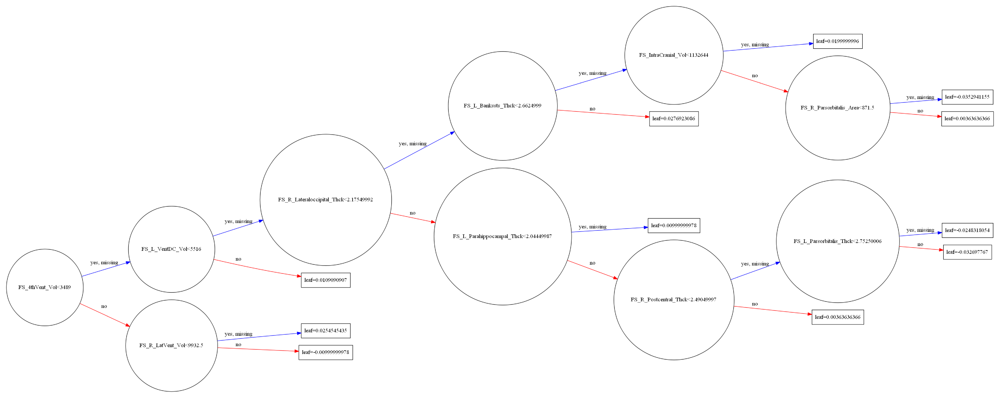

In [14]:
from xgboost import plot_tree
from matplotlib.pylab import rcParams
plt.style.use('default')
rcParams['figure.dpi'] = 200

plot_tree(gs.best_estimator_, num_trees=0, rankdir='LR')
fig = plt.gcf()
fig.set_size_inches(26.5,19)
plt.show()

# SHAP

In [15]:
import shap
shap.initjs()

In [16]:
explainer = shap.TreeExplainer(gs.best_estimator_)
shap_values = explainer.shap_values(X)

X_display, y_display = X, y

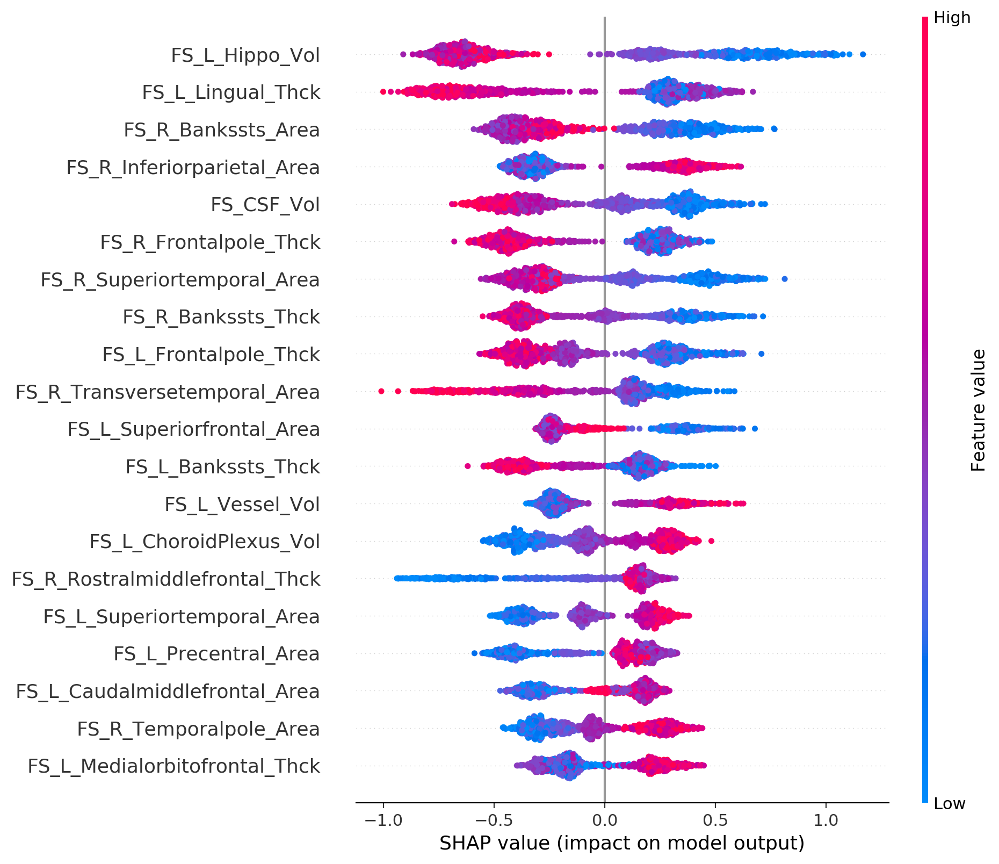

In [17]:
rcParams['figure.dpi'] = 120
plt.style.use('default')

shap.summary_plot(shap_values, X_display)

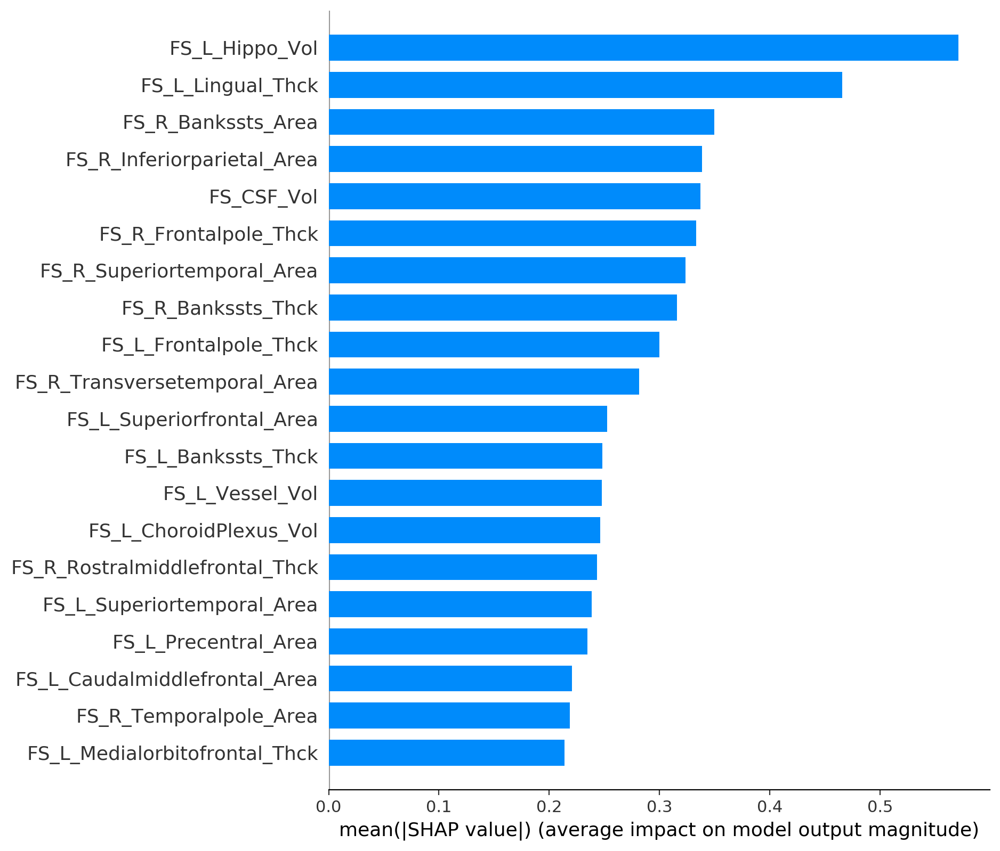

In [18]:
shap.summary_plot(shap_values, X_display, plot_type='bar')

# SHAP dependence plots
# top 20

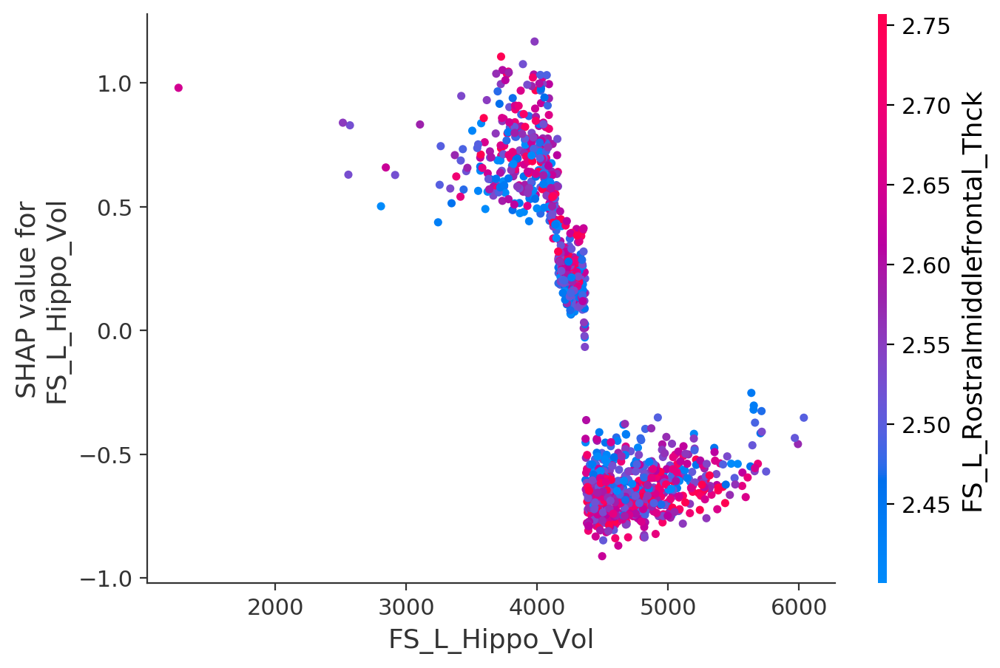

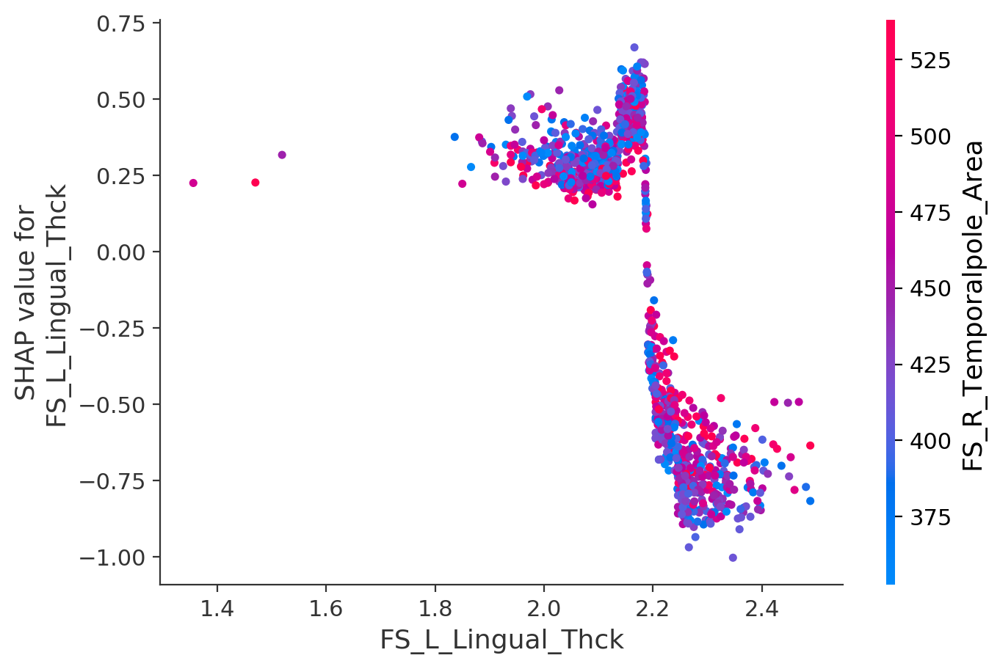

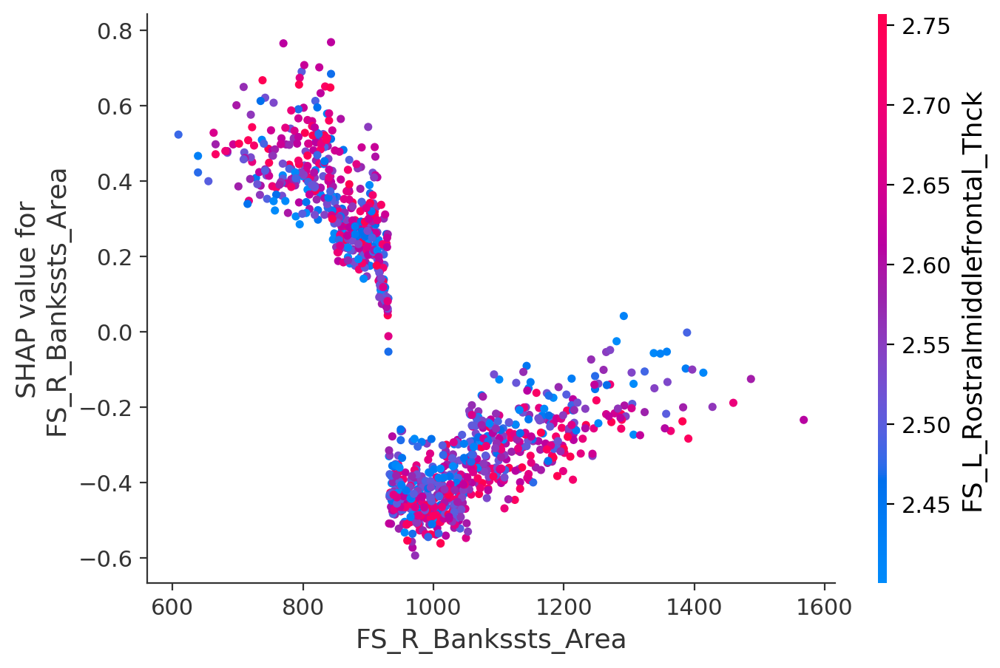

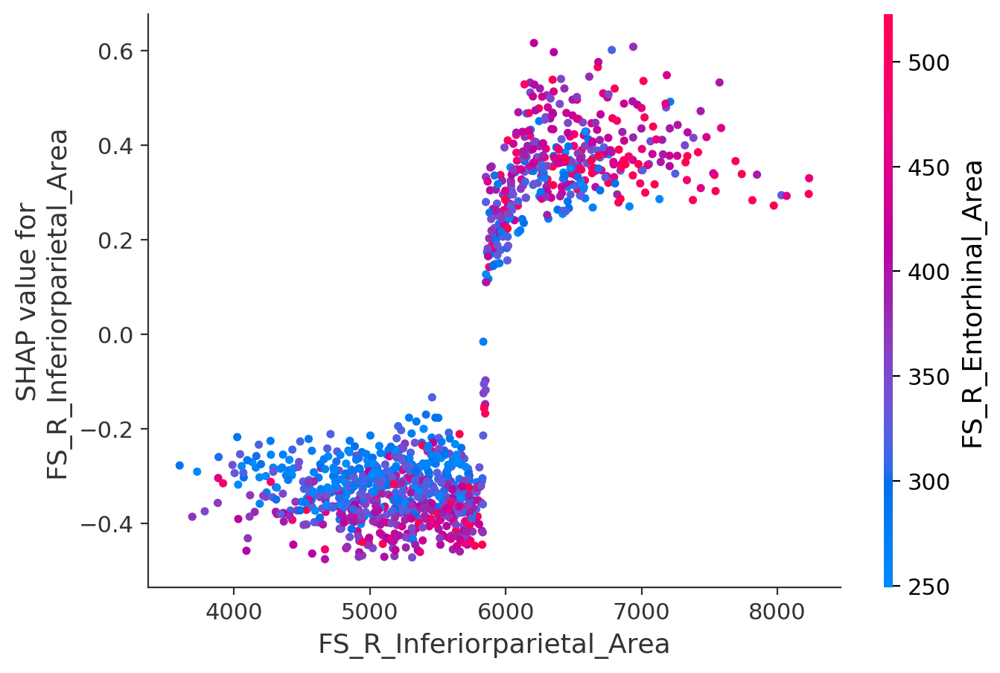

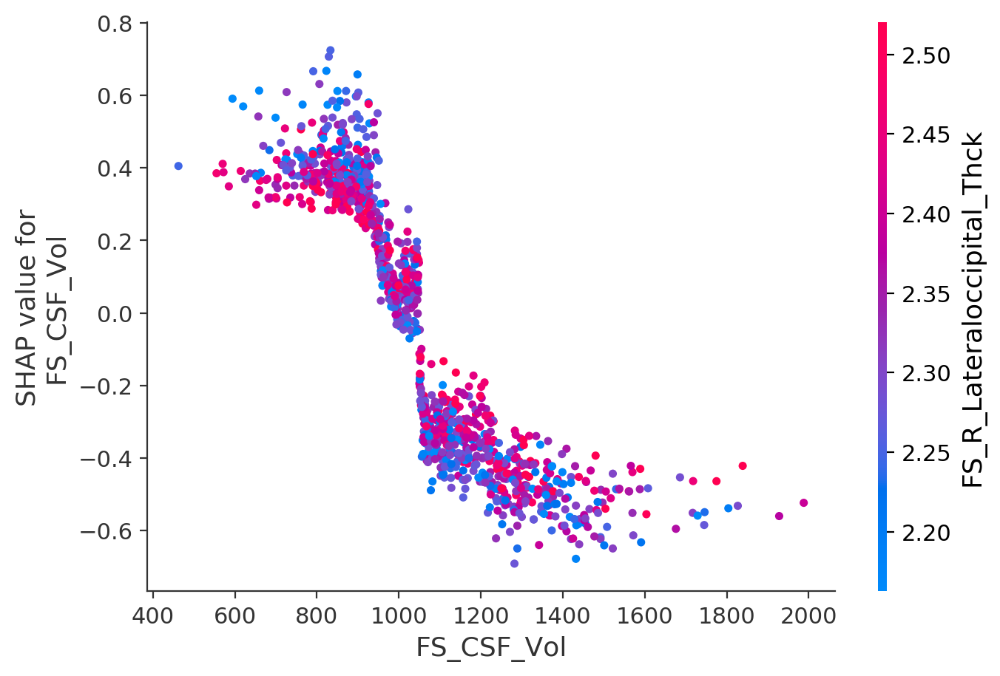

...

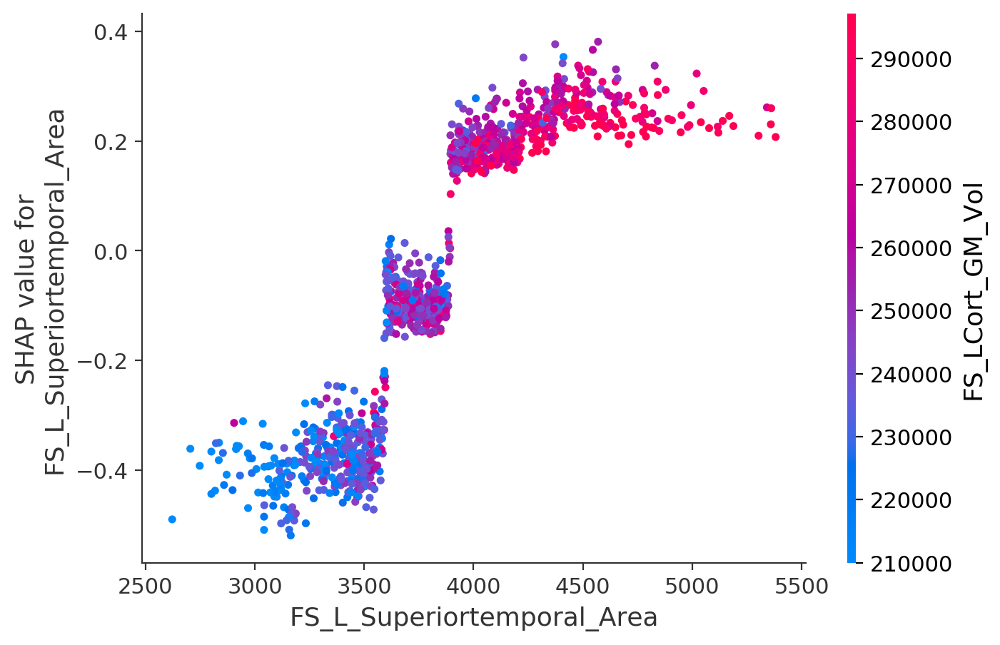

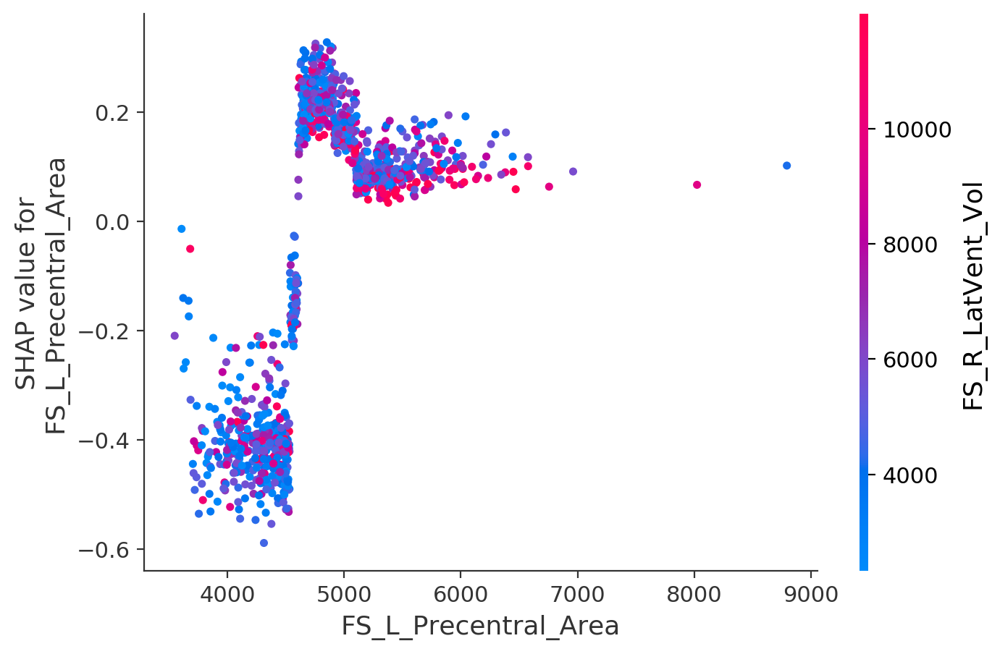

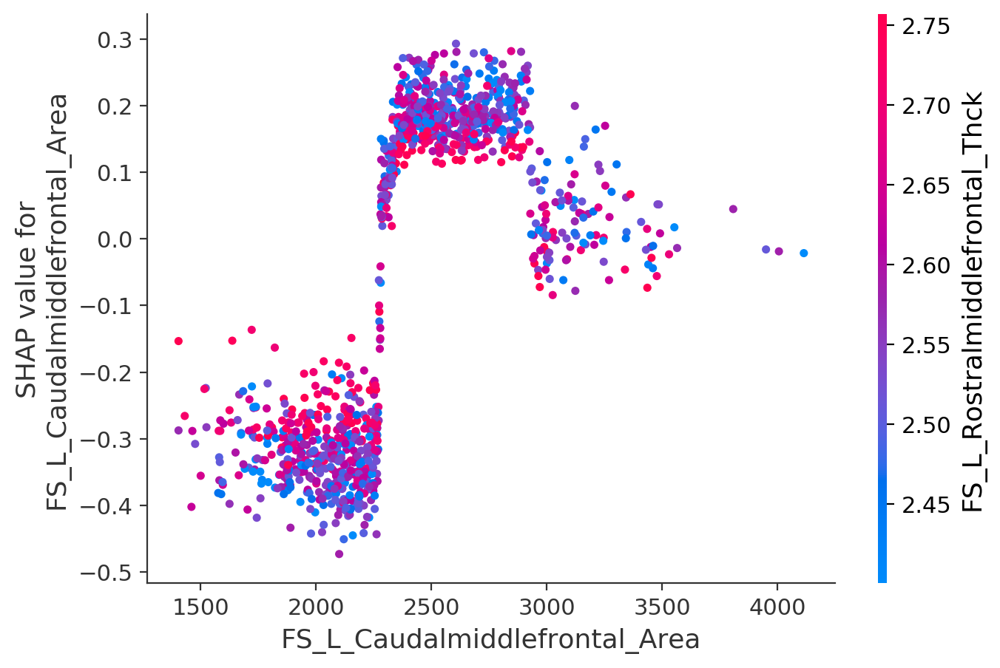

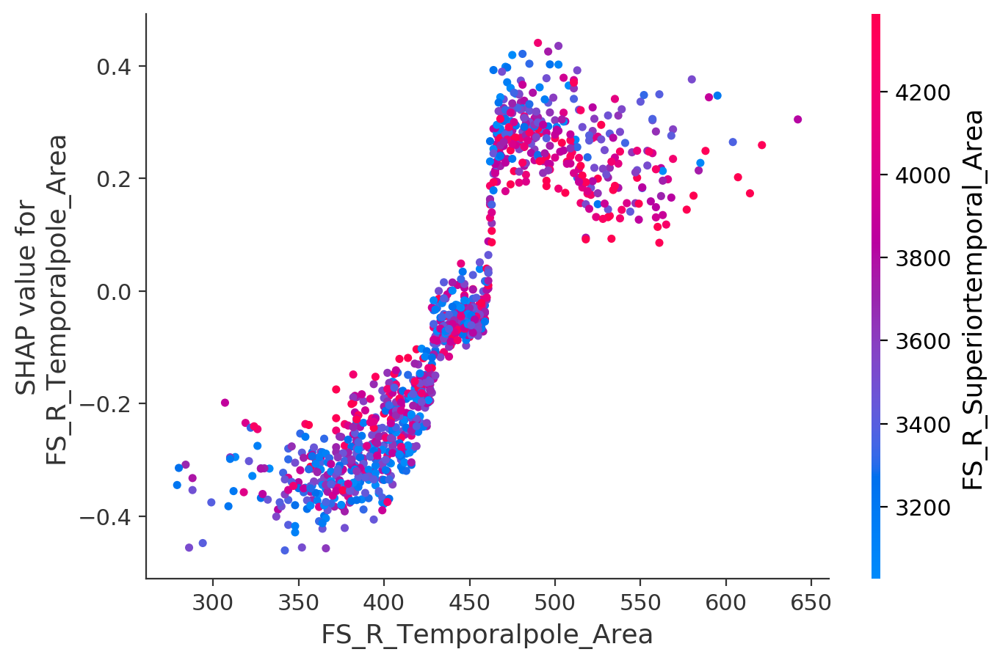

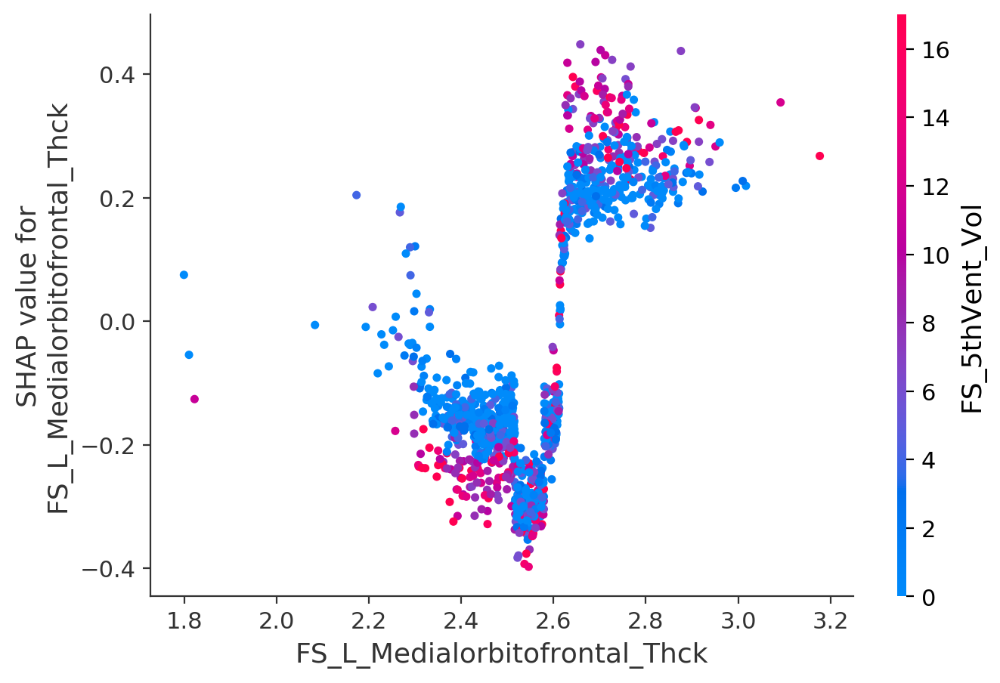

In [19]:
top_inds = np.argsort(-np.sum(np.abs(shap_values), 0))
for i in range(20):
    shap.dependence_plot(
        top_inds[i], 
        shap_values, 
        X, 
        display_features=X_display
    )

# SHAP interaction values

In [20]:
shap_interaction_values = shap.TreeExplainer(gs.best_estimator_).shap_interaction_values(X)
joblib.dump(shap_interaction_values, 'hcp_times_binary100x_shap_interaction_values_fs_brain.pkl')

['hcp_times_binary100x_shap_interaction_values_fs_brain.pkl']

# SHAP main effect value plots
# top 20

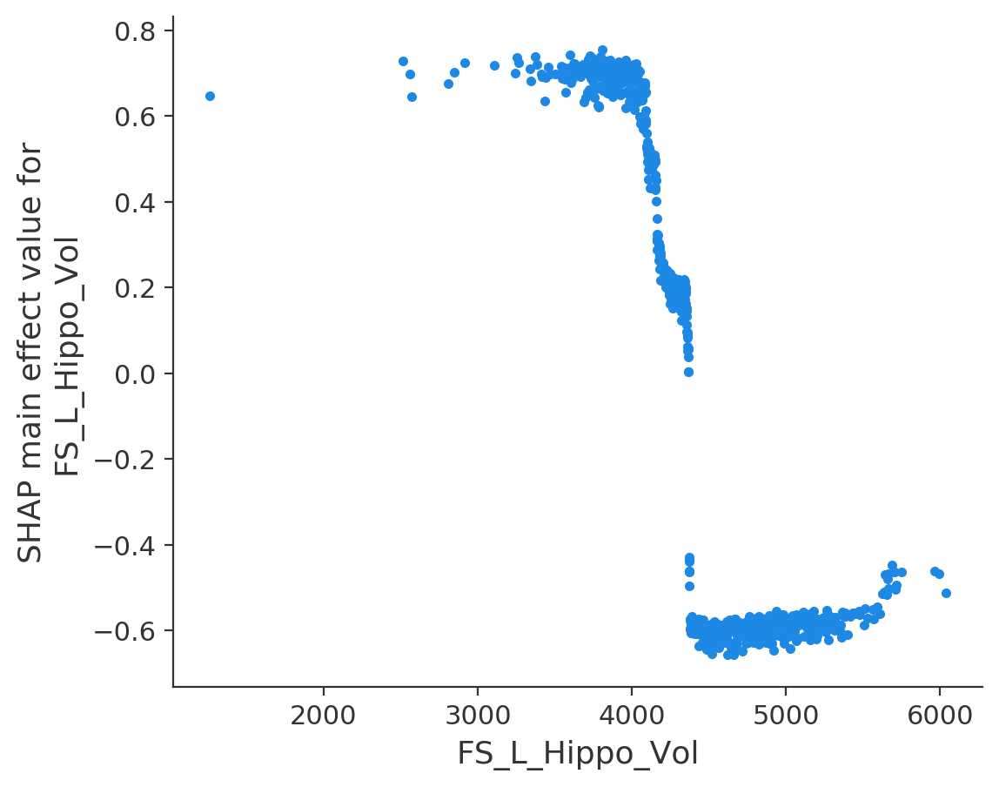

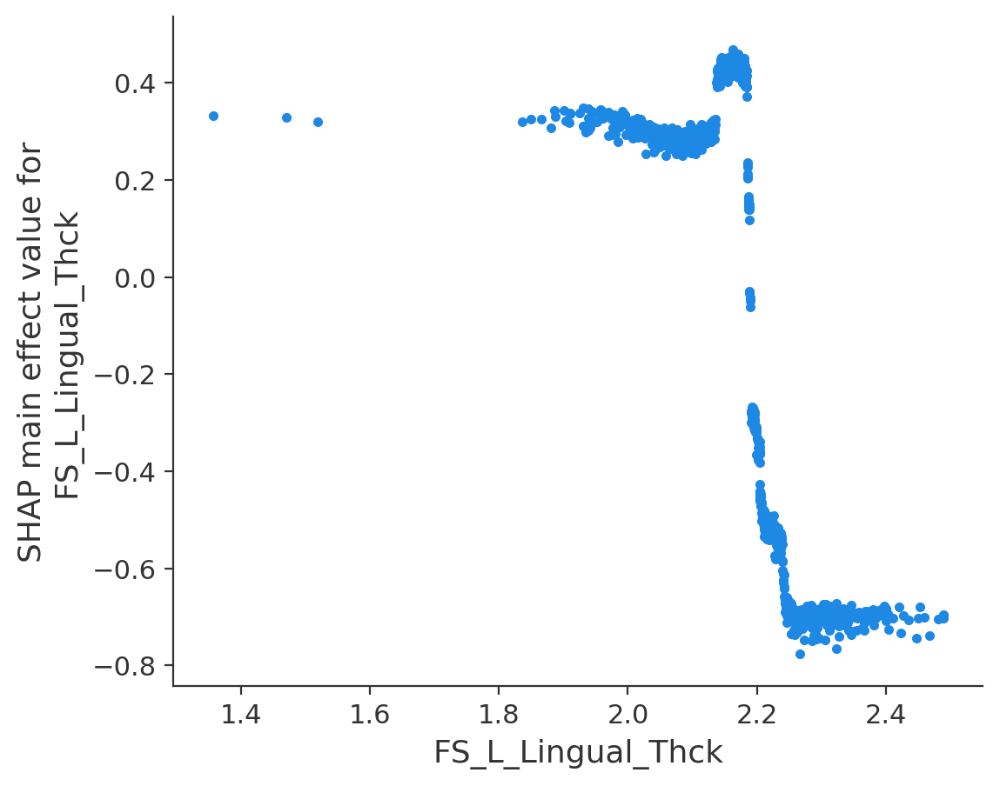

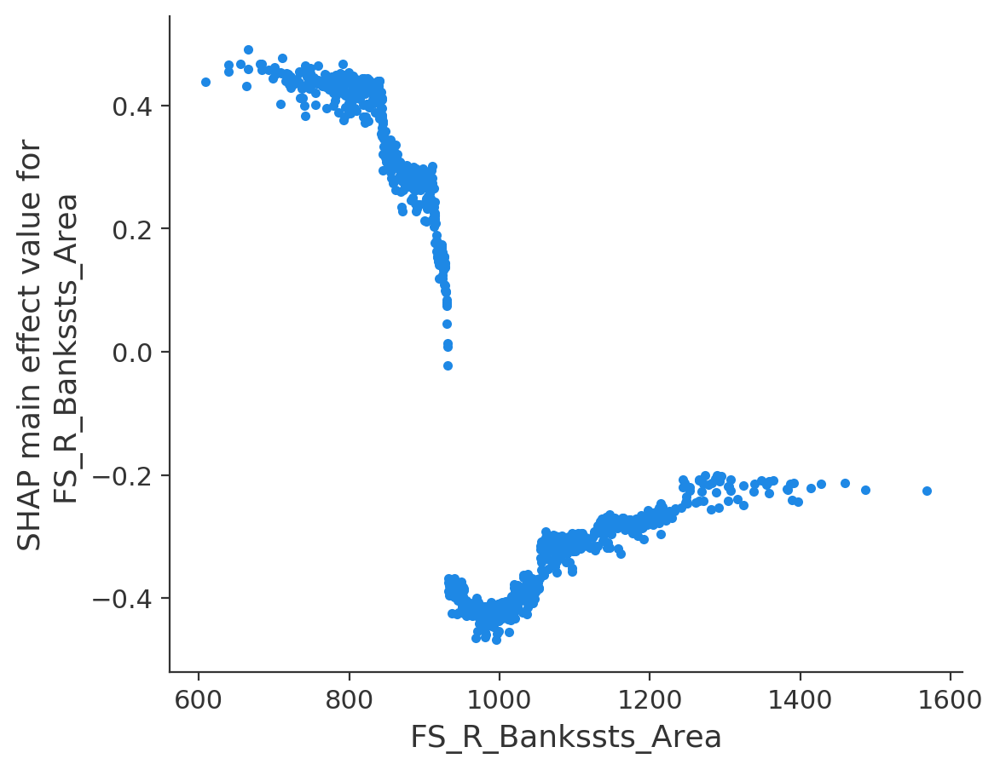

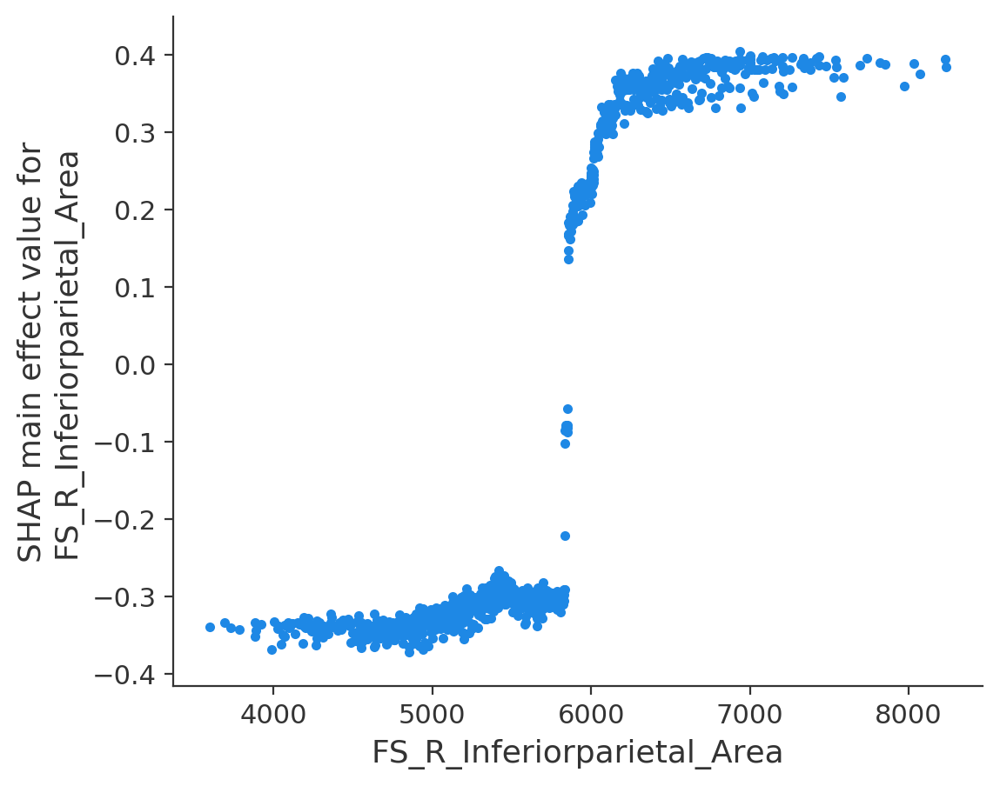

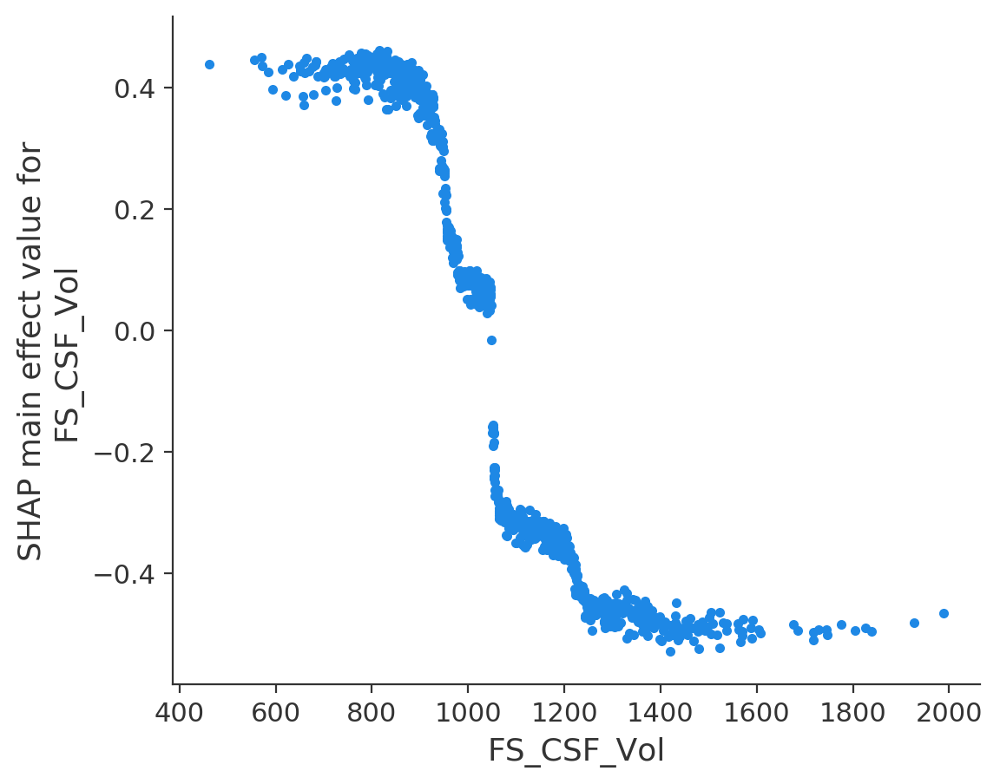

...

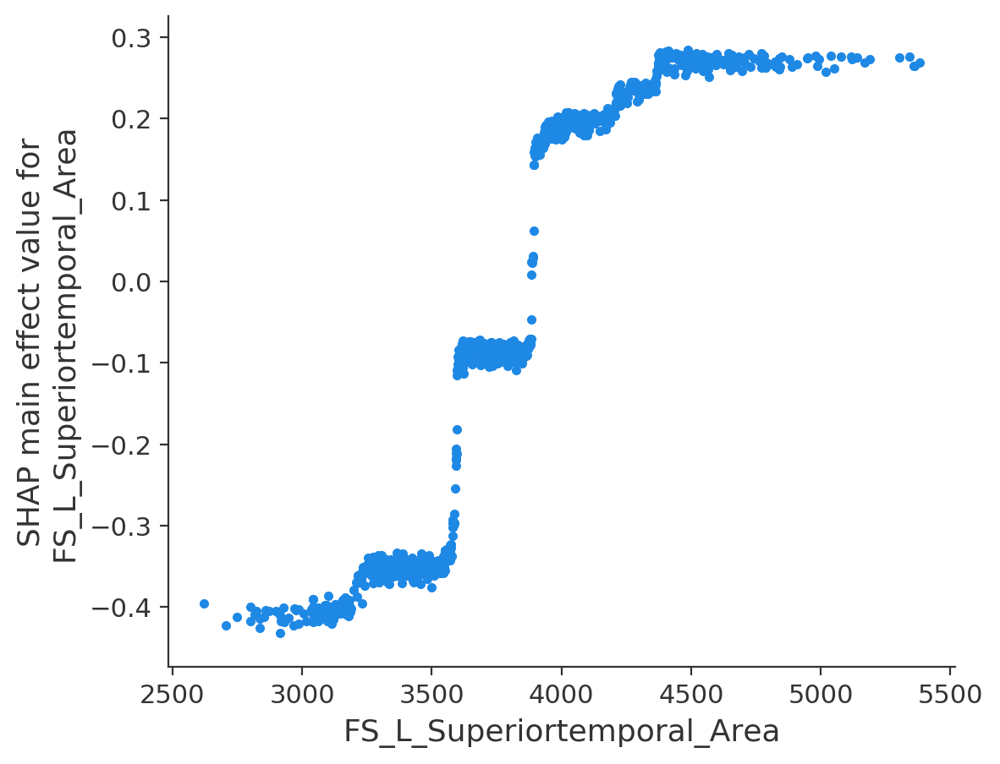

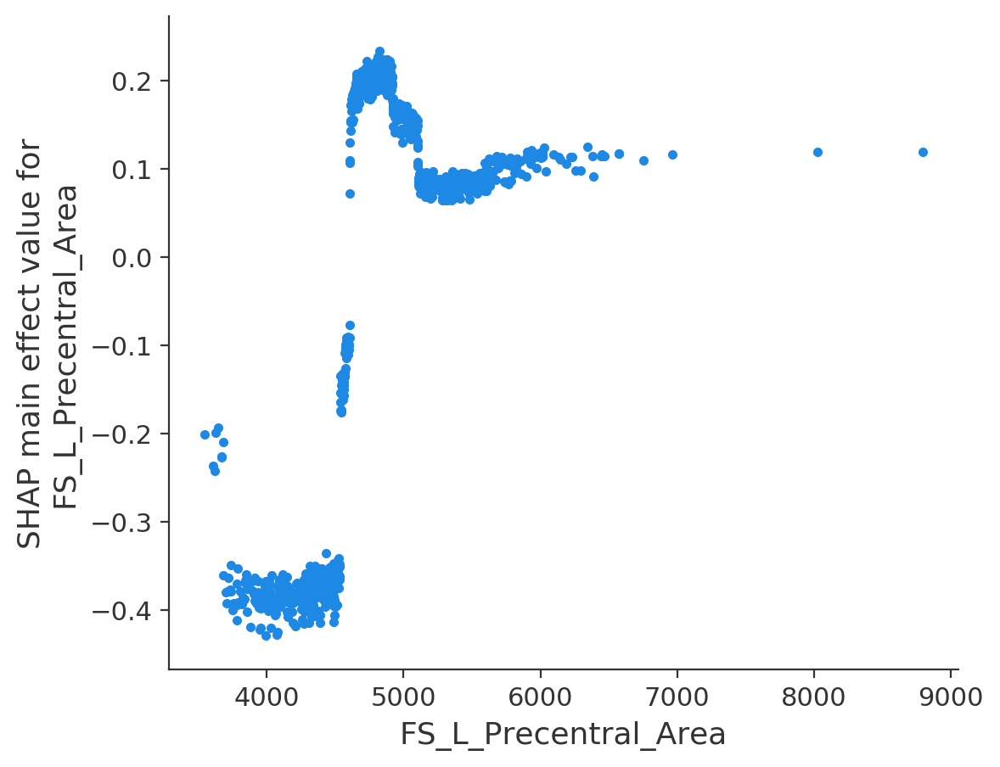

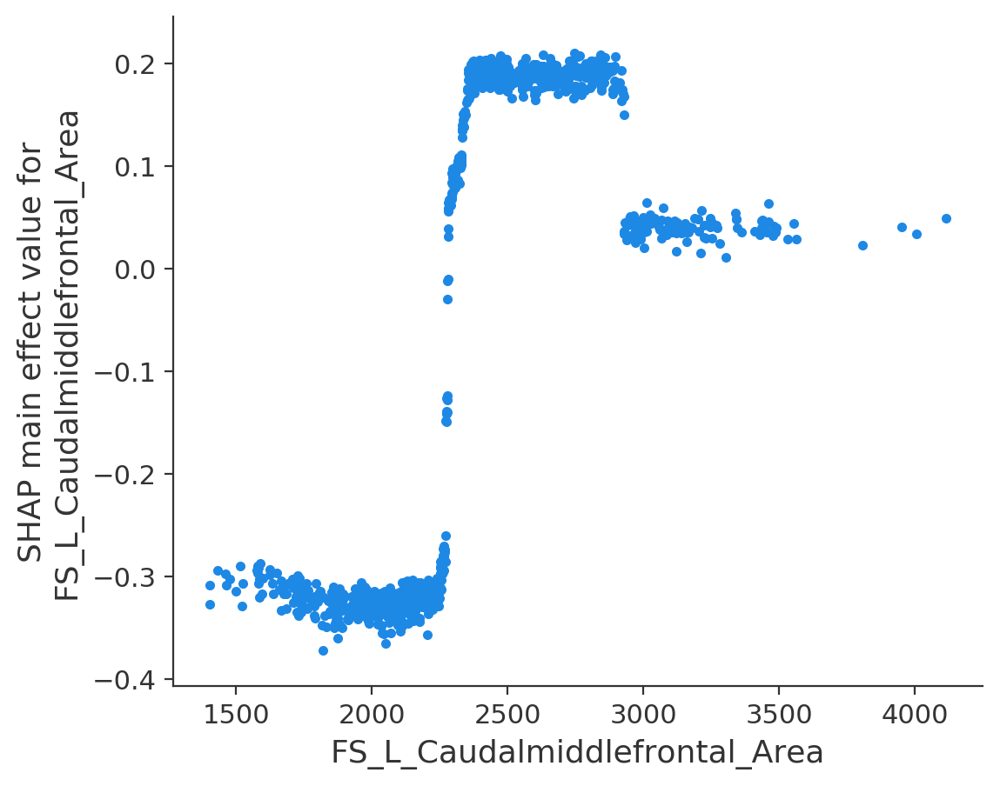

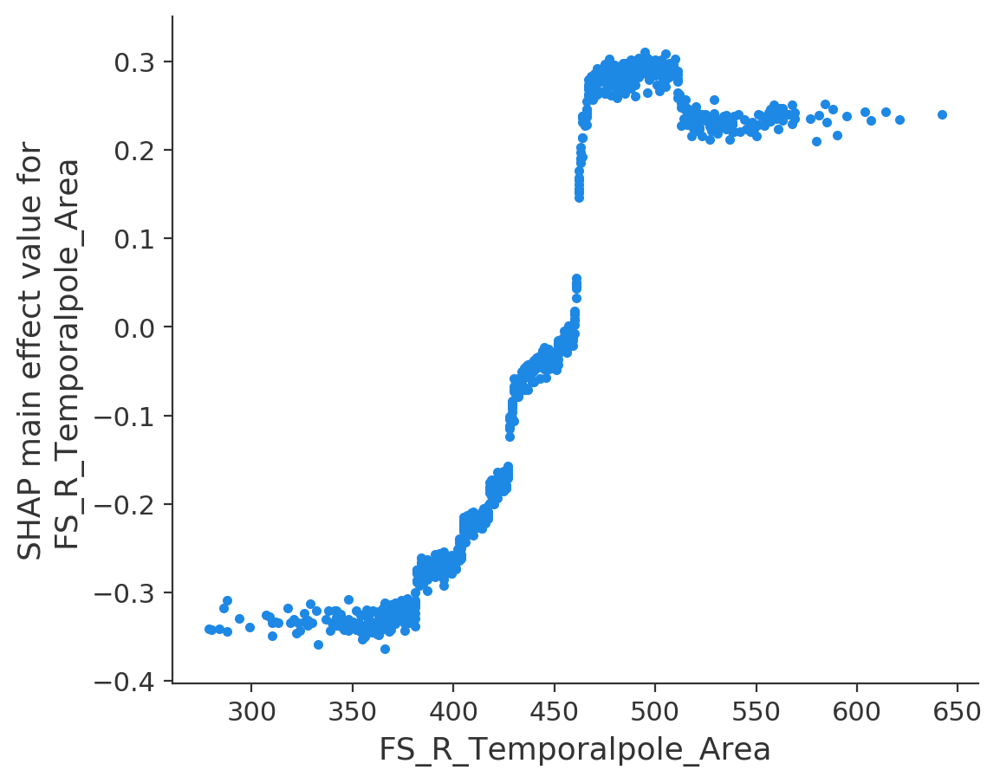

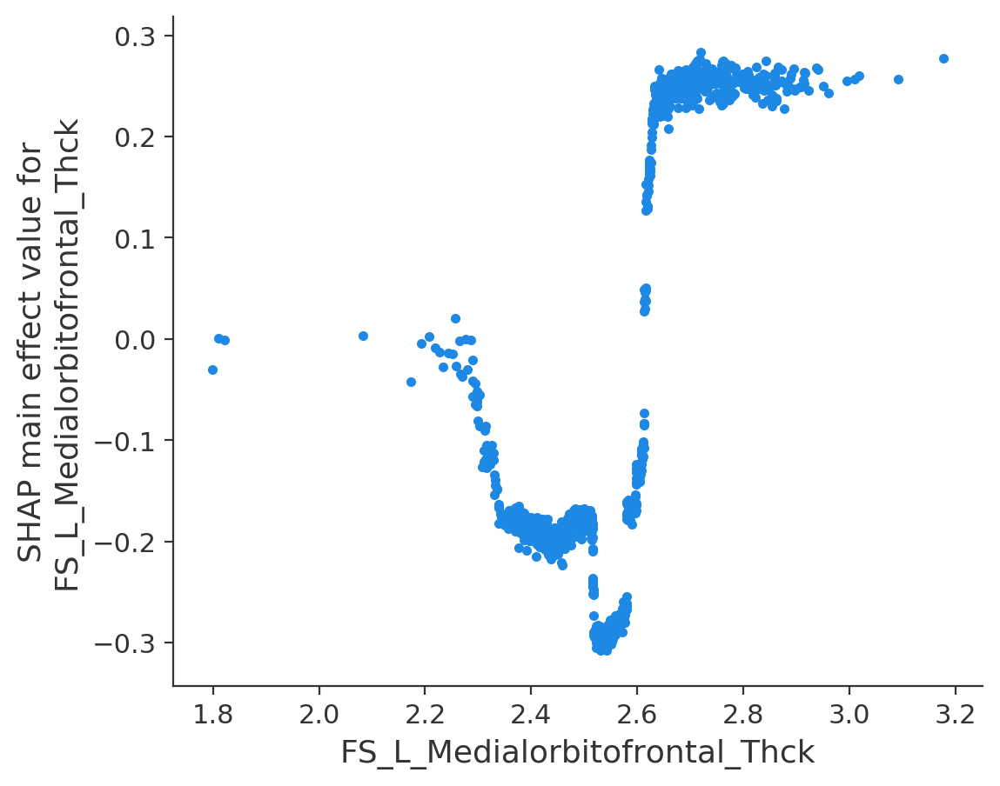

In [21]:
for i in range(20):
    shap.dependence_plot(
        (top_inds[i], top_inds[i]),
        shap_interaction_values, 
        X
    )

# SHAP interaction value plots
# top 20

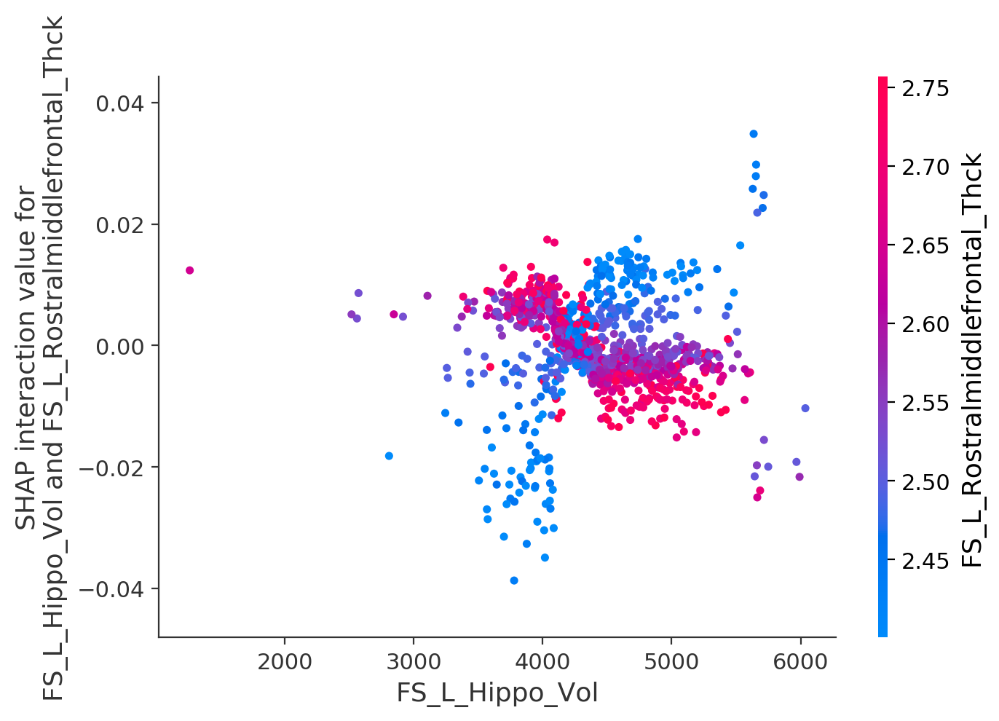

In [25]:
shap.dependence_plot(
    ('FS_L_Hippo_Vol', 'FS_L_Rostralmiddlefrontal_Thck'),
    shap_interaction_values, 
    X
)

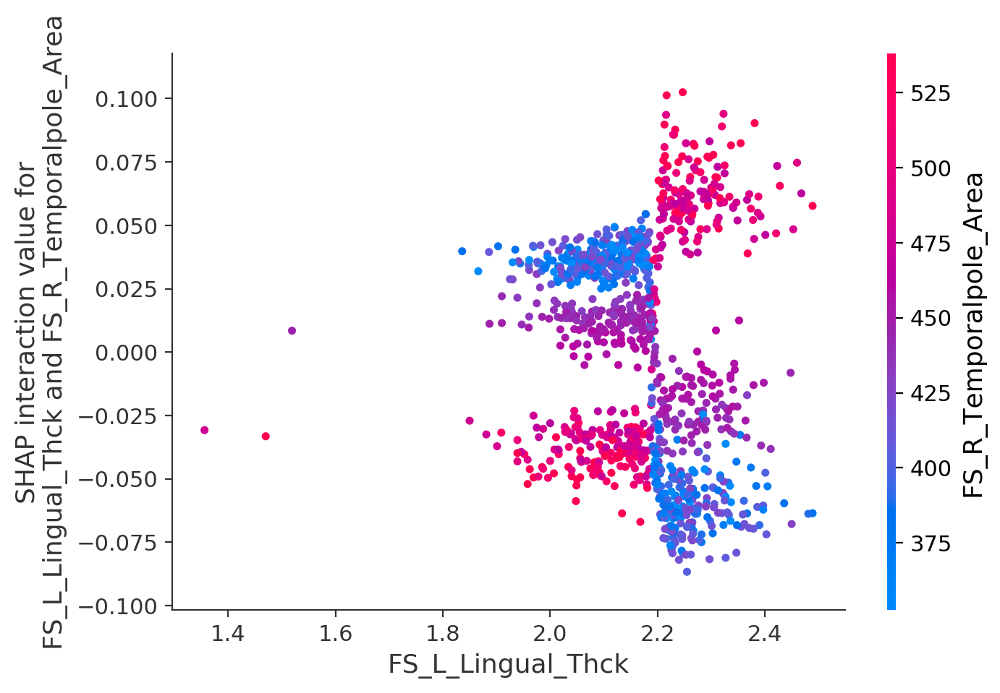

In [26]:
shap.dependence_plot(
    ('FS_L_Lingual_Thck', 'FS_R_Temporalpole_Area'),
    shap_interaction_values, 
    X
)

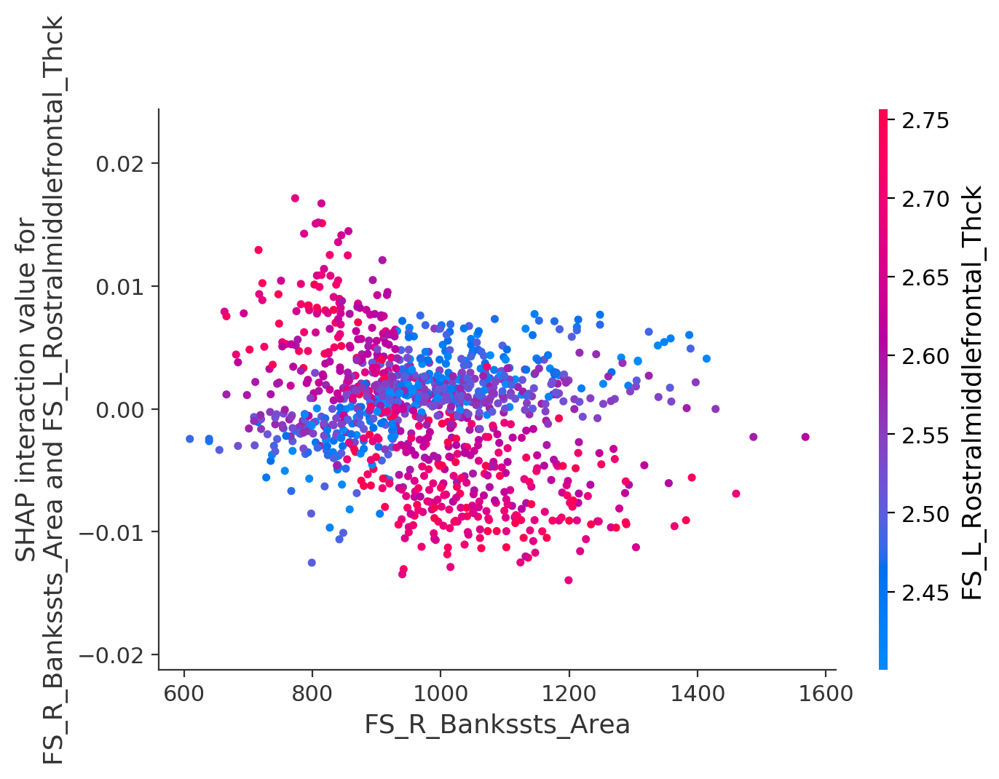

In [27]:
shap.dependence_plot(
    ('FS_R_Bankssts_Area', 'FS_L_Rostralmiddlefrontal_Thck'),
    shap_interaction_values, 
    X
)

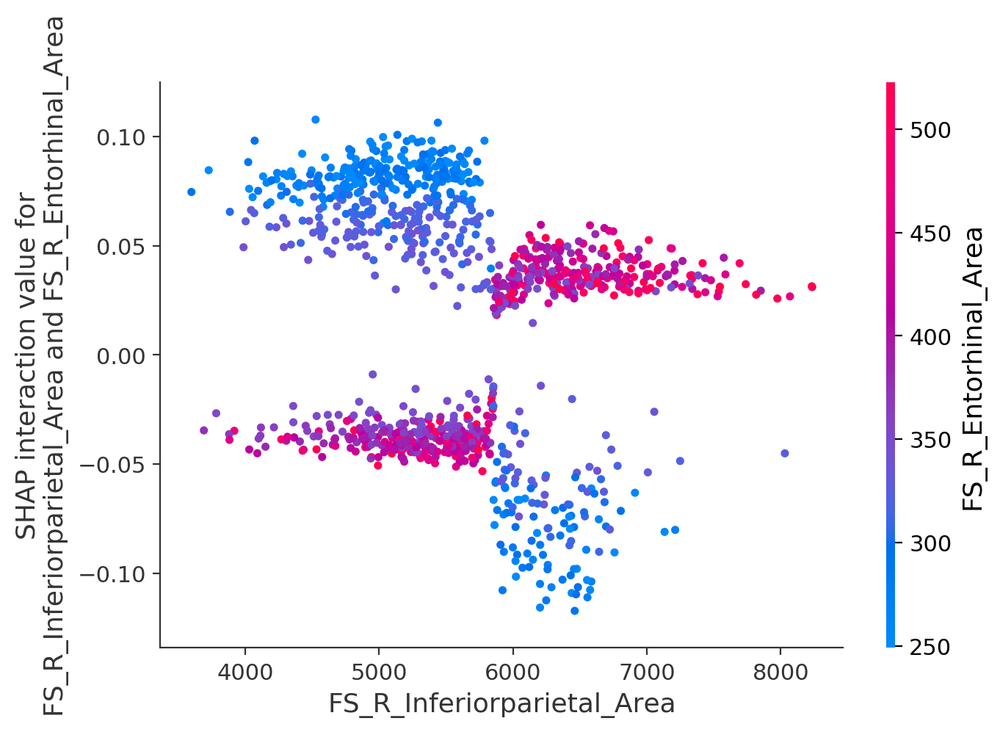

In [28]:
shap.dependence_plot(
    ('FS_R_Inferiorparietal_Area', 'FS_R_Entorhinal_Area'),
    shap_interaction_values, 
    X
)

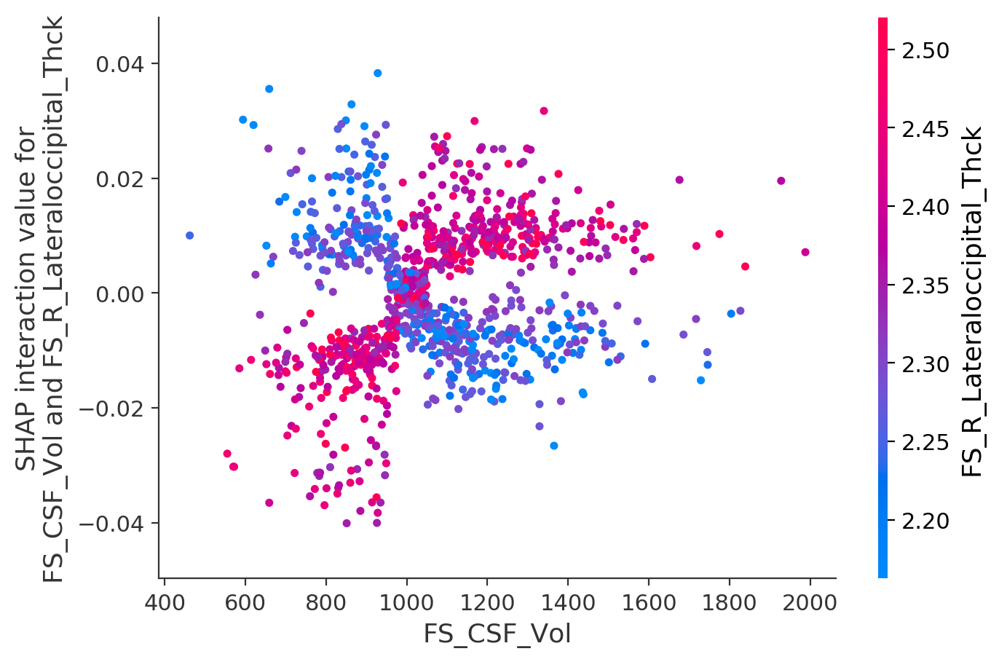

In [29]:
shap.dependence_plot(
    ('FS_CSF_Vol', 'FS_R_Lateraloccipital_Thck'),
    shap_interaction_values, 
    X
)

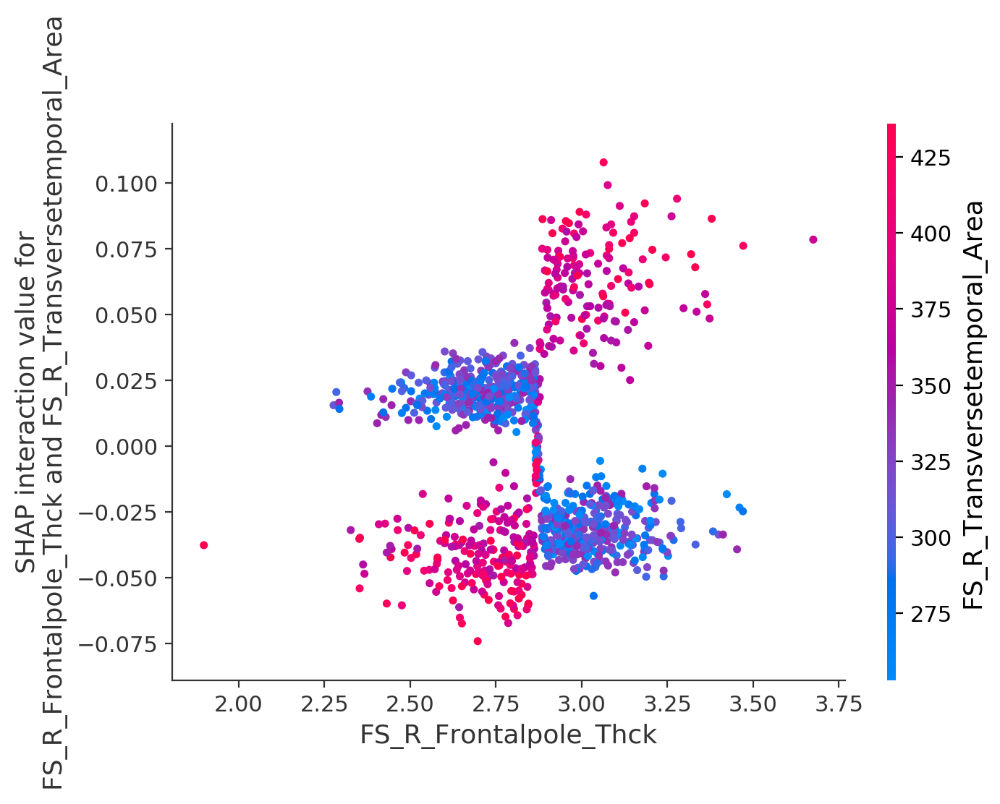

In [30]:
shap.dependence_plot(
    ('FS_R_Frontalpole_Thck', 'FS_R_Transversetemporal_Area'),
    shap_interaction_values, 
    X
)

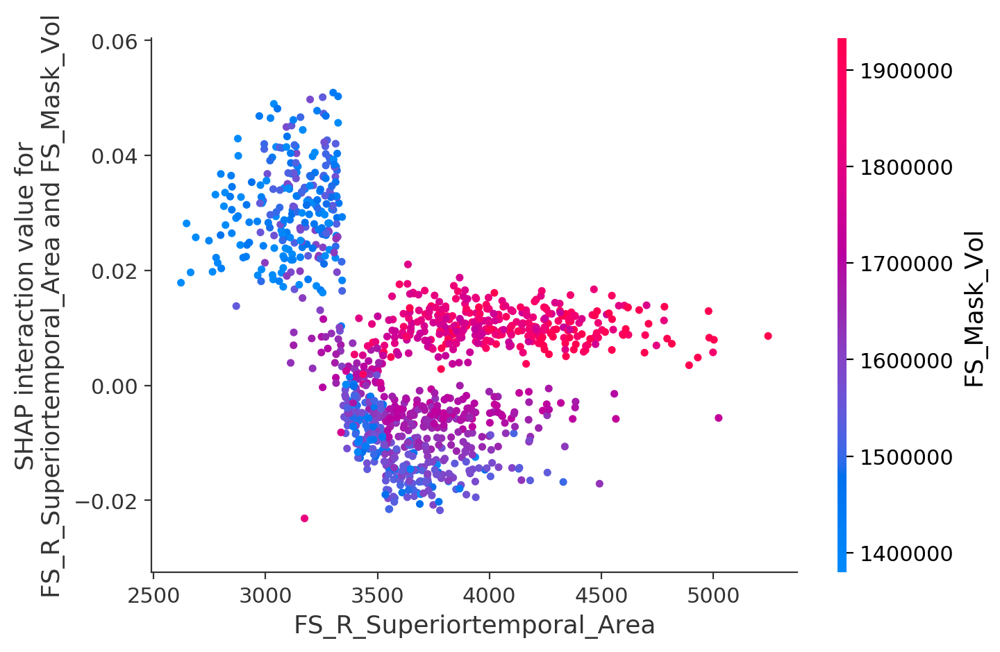

In [31]:
shap.dependence_plot(
    ('FS_R_Superiortemporal_Area', 'FS_Mask_Vol'),
    shap_interaction_values, 
    X
)

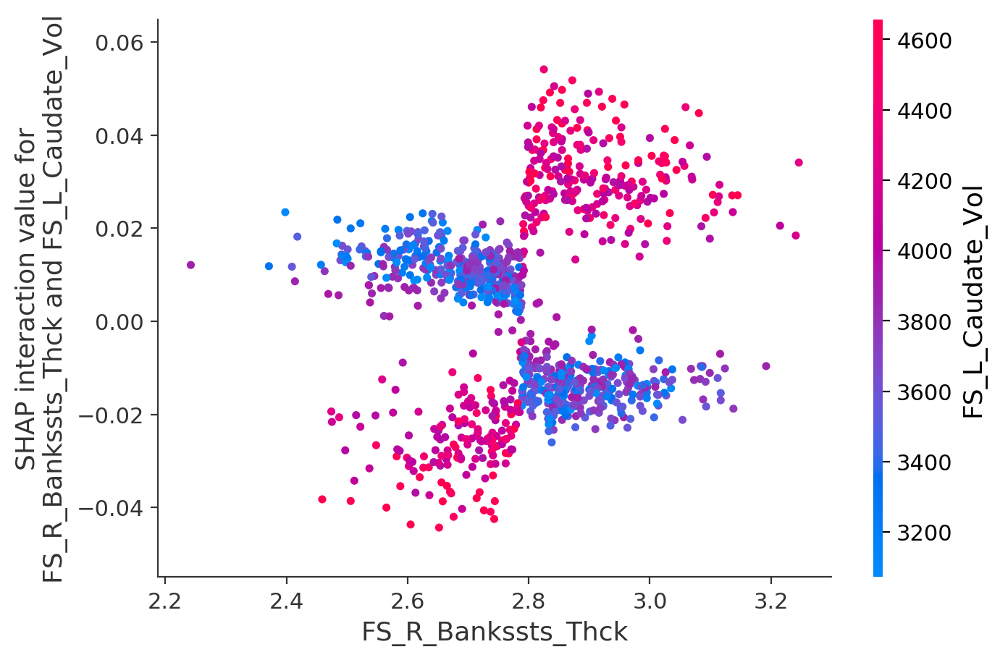

In [32]:
shap.dependence_plot(
    ('FS_R_Bankssts_Thck', 'FS_L_Caudate_Vol'),
    shap_interaction_values, 
    X
)

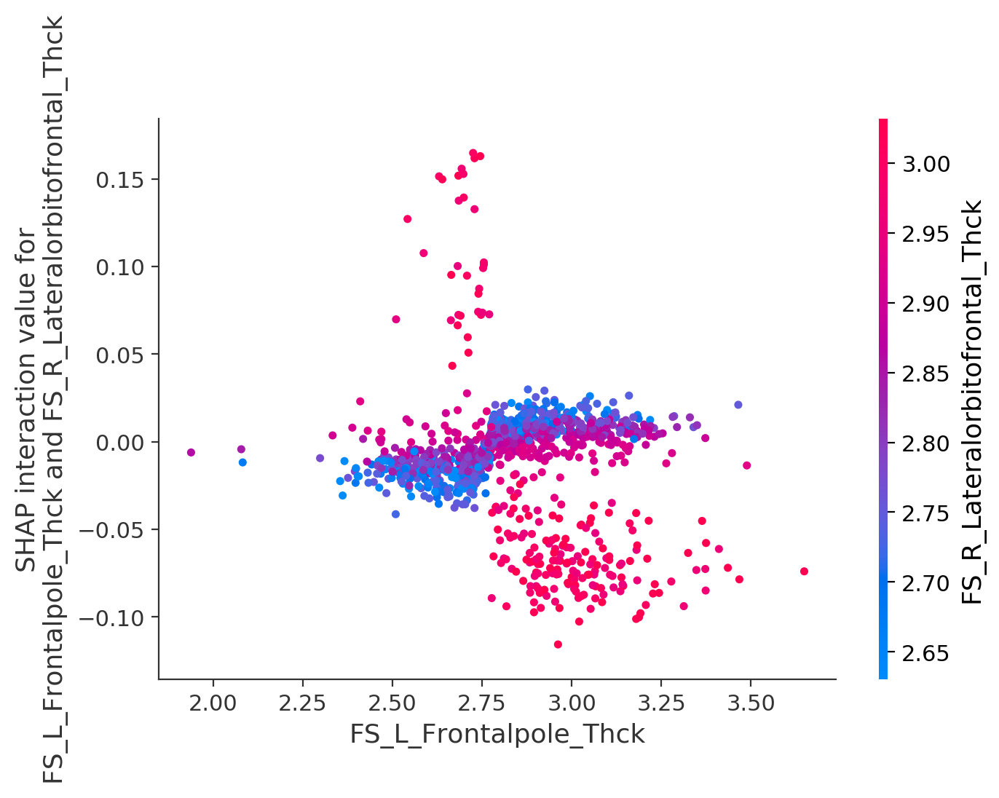

In [33]:
shap.dependence_plot(
    ('FS_L_Frontalpole_Thck', 'FS_R_Lateralorbitofrontal_Thck'),
    shap_interaction_values, 
    X
)

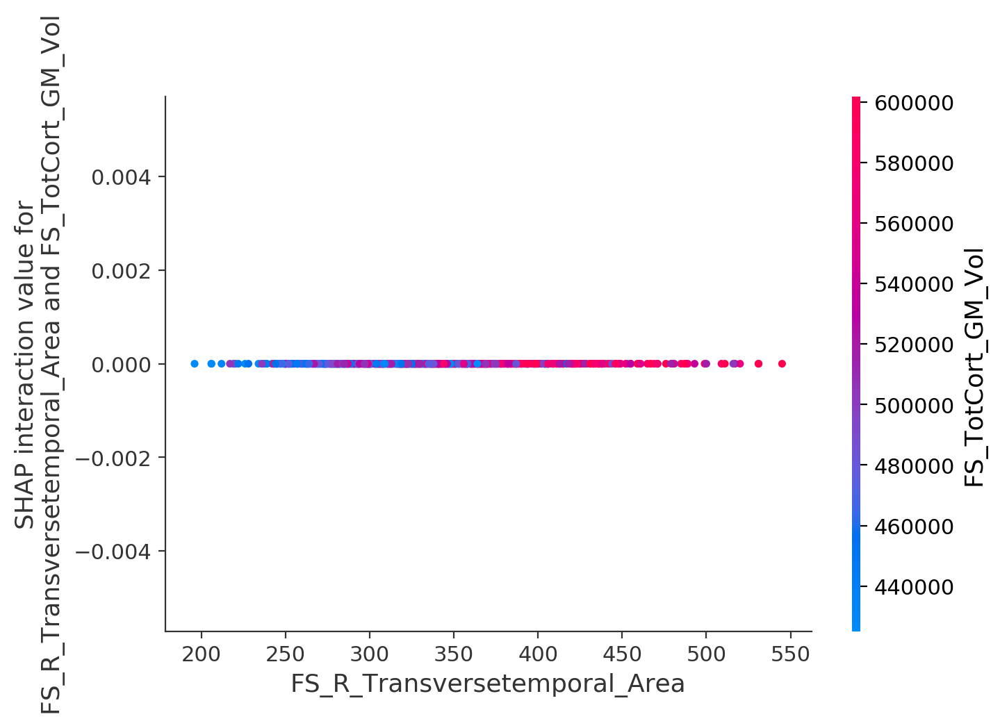

In [34]:
shap.dependence_plot(
    ('FS_R_Transversetemporal_Area', 'FS_TotCort_GM_Vol'),
    shap_interaction_values, 
    X
)

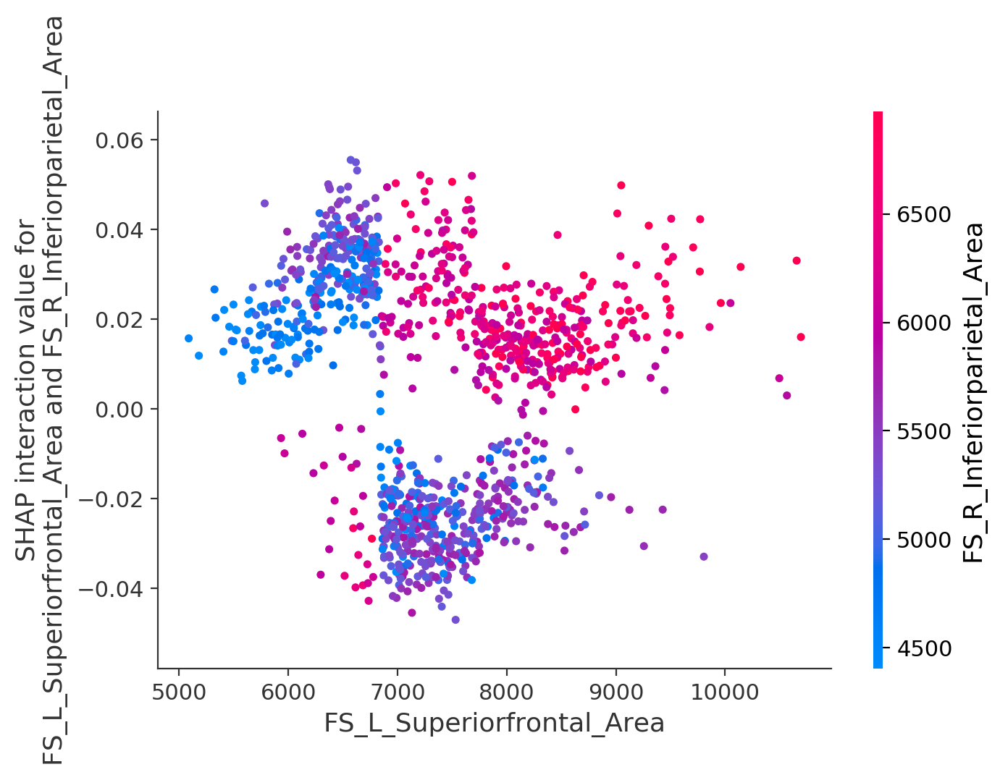

In [35]:
shap.dependence_plot(
    ('FS_L_Superiorfrontal_Area', 'FS_R_Inferiorparietal_Area'),
    shap_interaction_values, 
    X
)

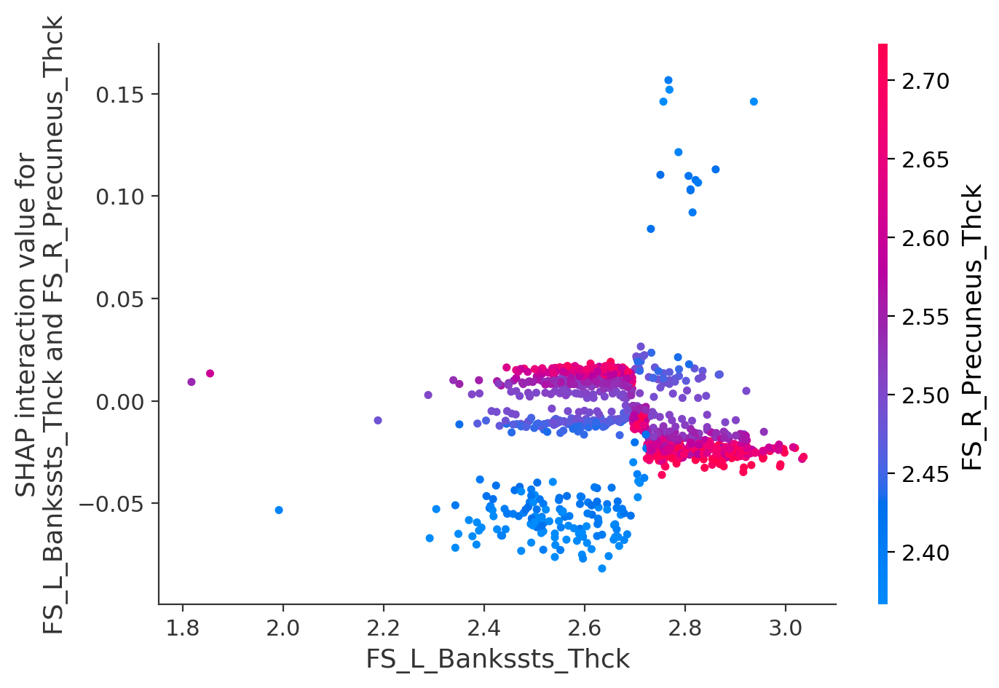

In [36]:
shap.dependence_plot(
    ('FS_L_Bankssts_Thck', 'FS_R_Precuneus_Thck'),
    shap_interaction_values, 
    X
)

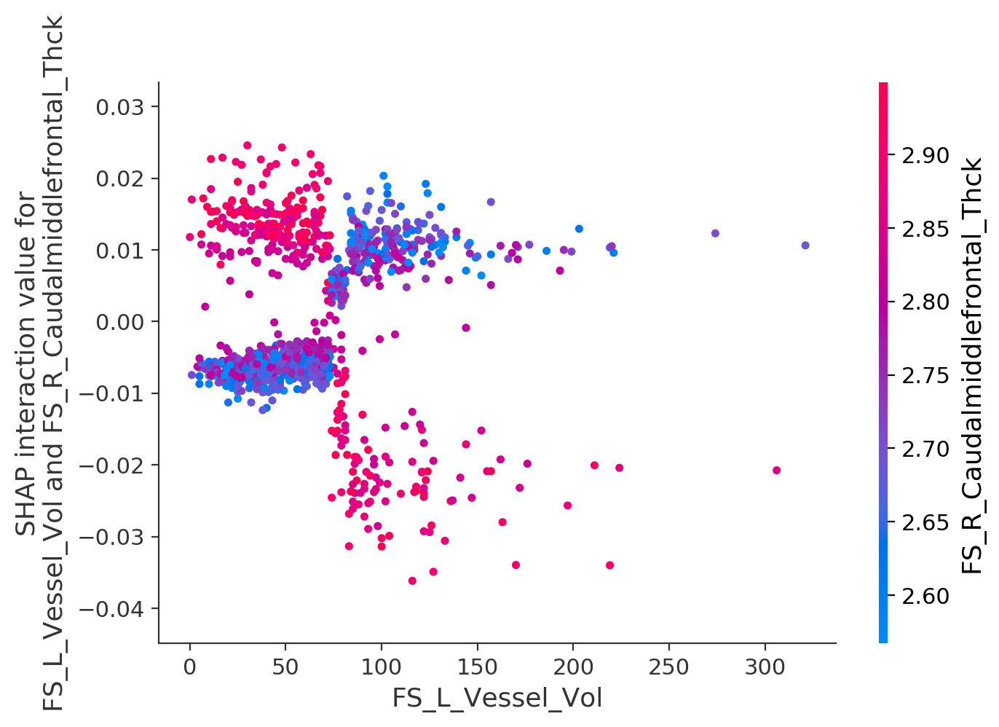

In [37]:
shap.dependence_plot(
    ('FS_L_Vessel_Vol', 'FS_R_Caudalmiddlefrontal_Thck'),
    shap_interaction_values, 
    X
)

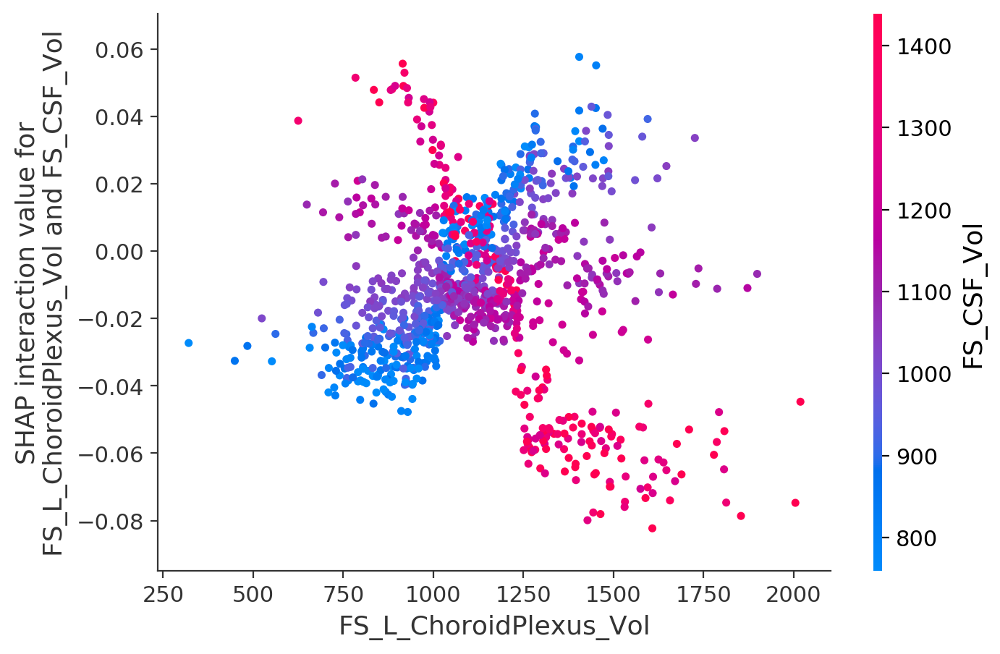

In [38]:
shap.dependence_plot(
    ('FS_L_ChoroidPlexus_Vol', 'FS_CSF_Vol'),
    shap_interaction_values, 
    X
)

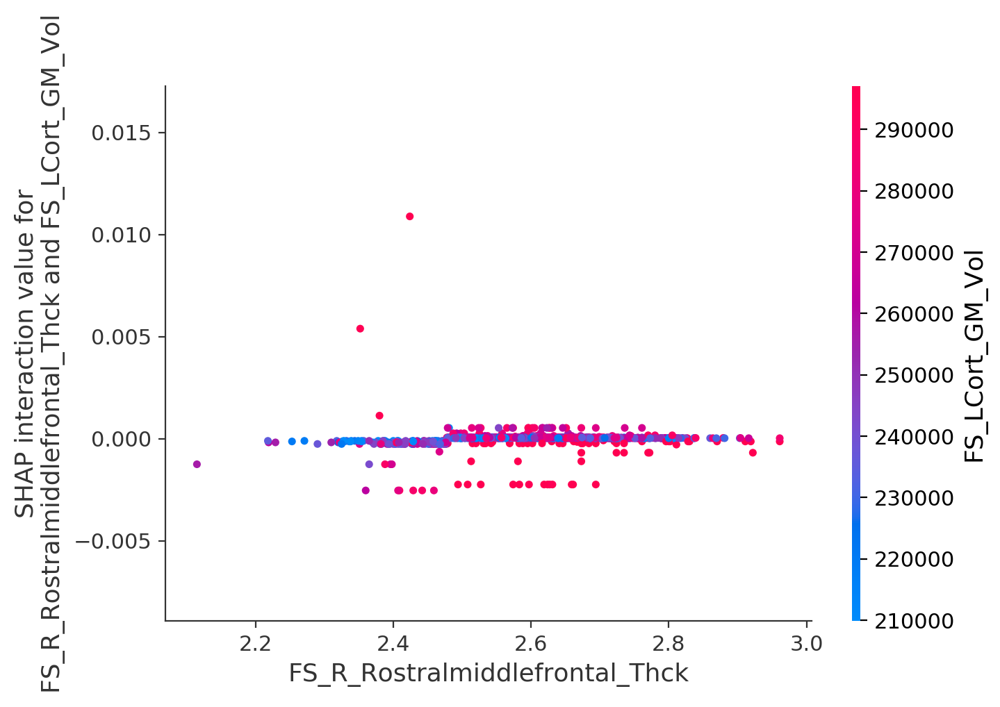

In [39]:
shap.dependence_plot(
    ('FS_R_Rostralmiddlefrontal_Thck', 'FS_LCort_GM_Vol'),
    shap_interaction_values, 
    X
)

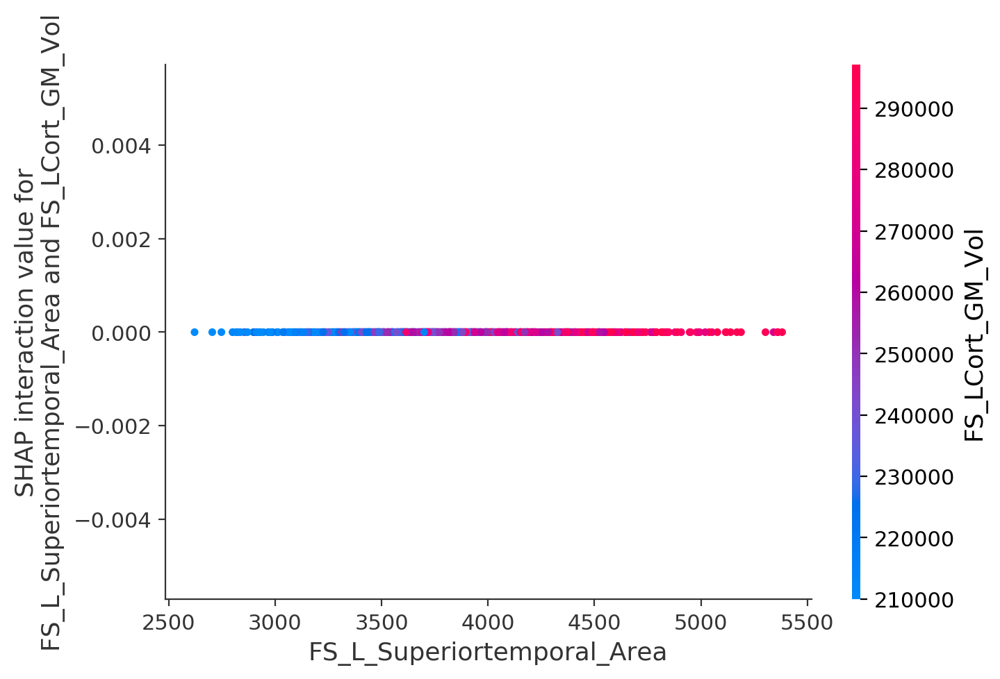

In [41]:
shap.dependence_plot(
    ('FS_L_Superiortemporal_Area', 'FS_LCort_GM_Vol'),
    shap_interaction_values, 
    X
)

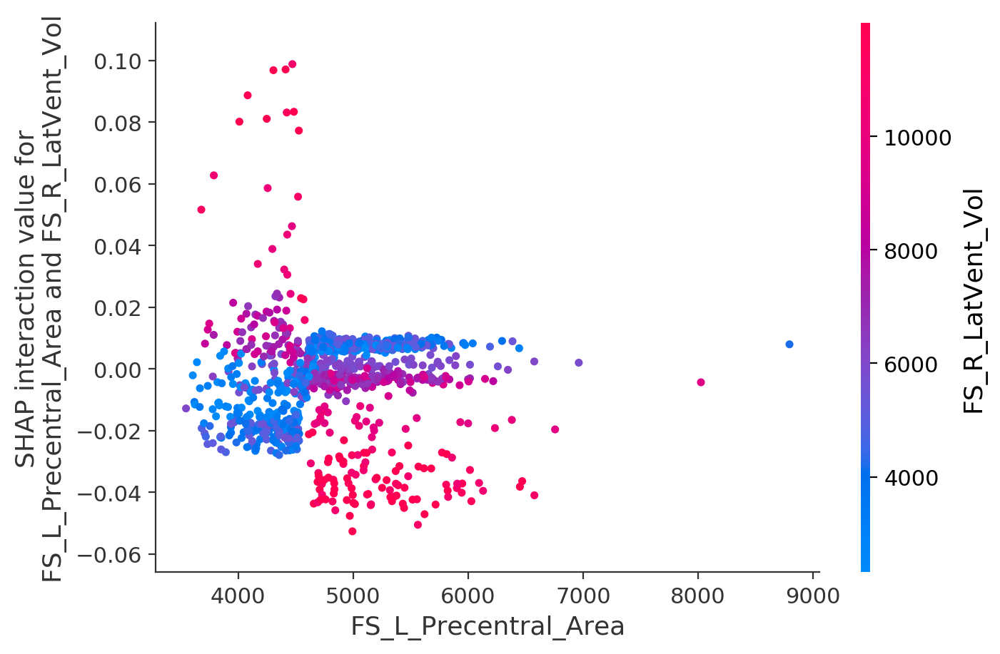

In [42]:
shap.dependence_plot(
    ('FS_L_Precentral_Area', 'FS_R_LatVent_Vol'),
    shap_interaction_values, 
    X
)

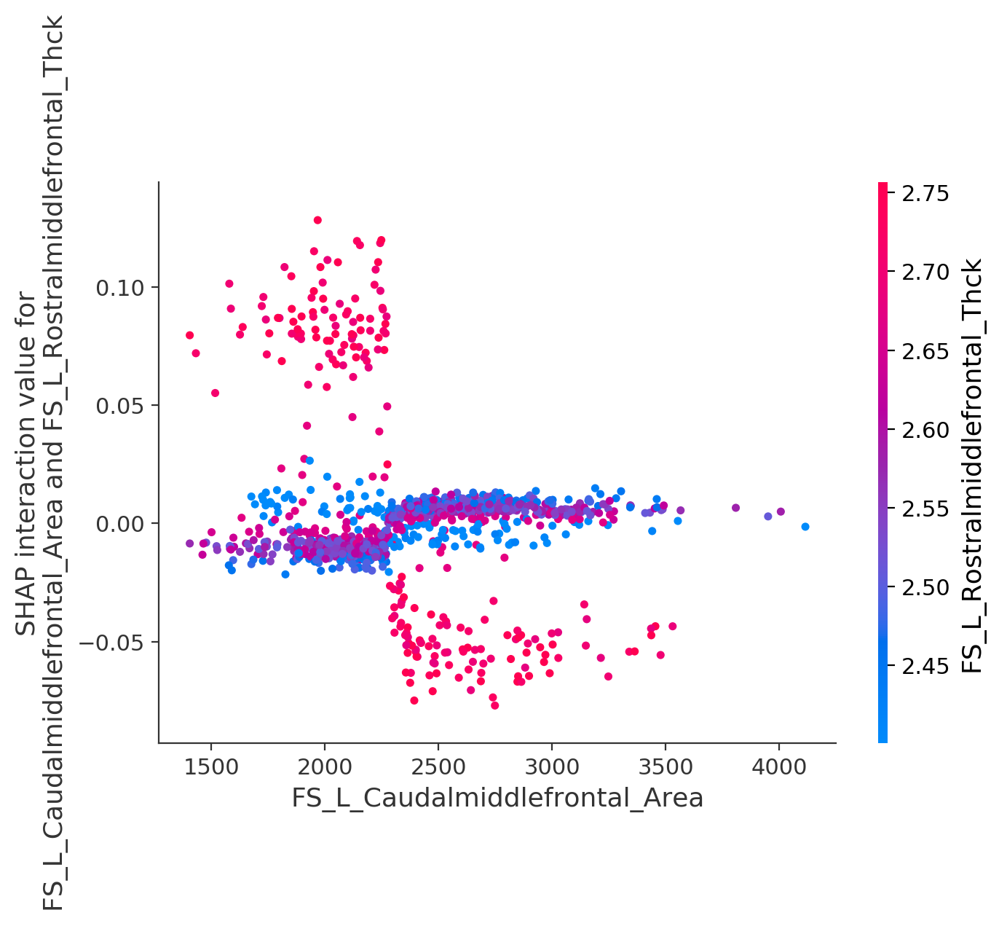

In [43]:
shap.dependence_plot(
    ('FS_L_Caudalmiddlefrontal_Area', 'FS_L_Rostralmiddlefrontal_Thck'),
    shap_interaction_values, 
    X
)

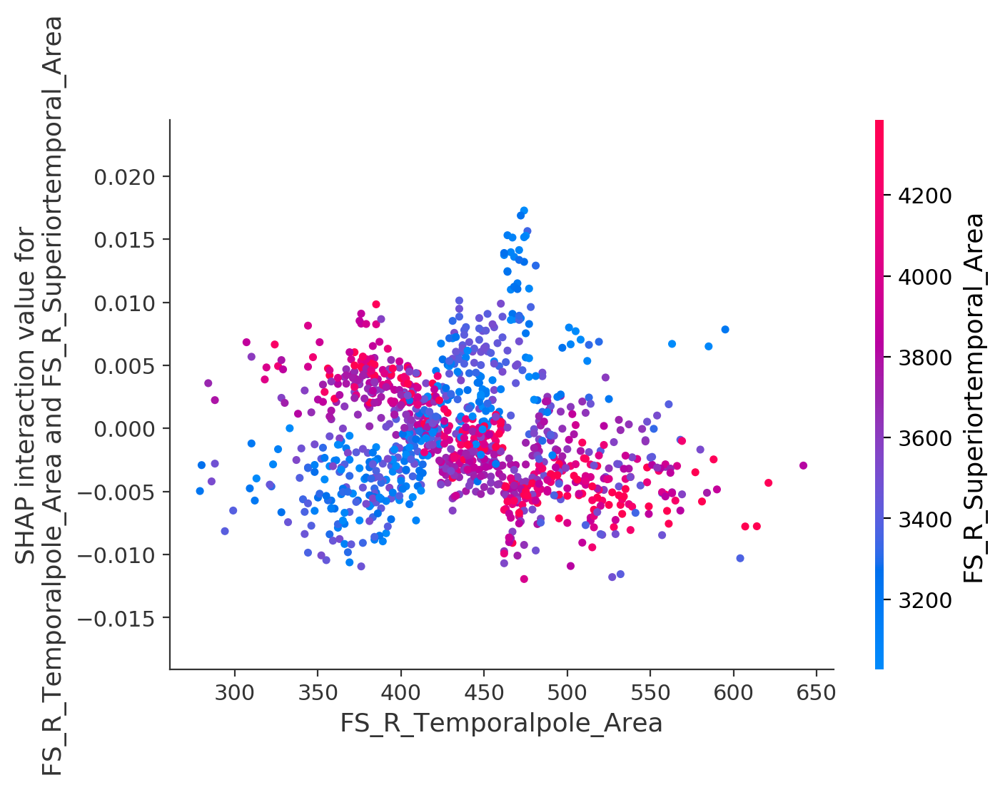

In [44]:
shap.dependence_plot(
    ('FS_R_Temporalpole_Area', 'FS_R_Superiortemporal_Area'),
    shap_interaction_values, 
    X
)

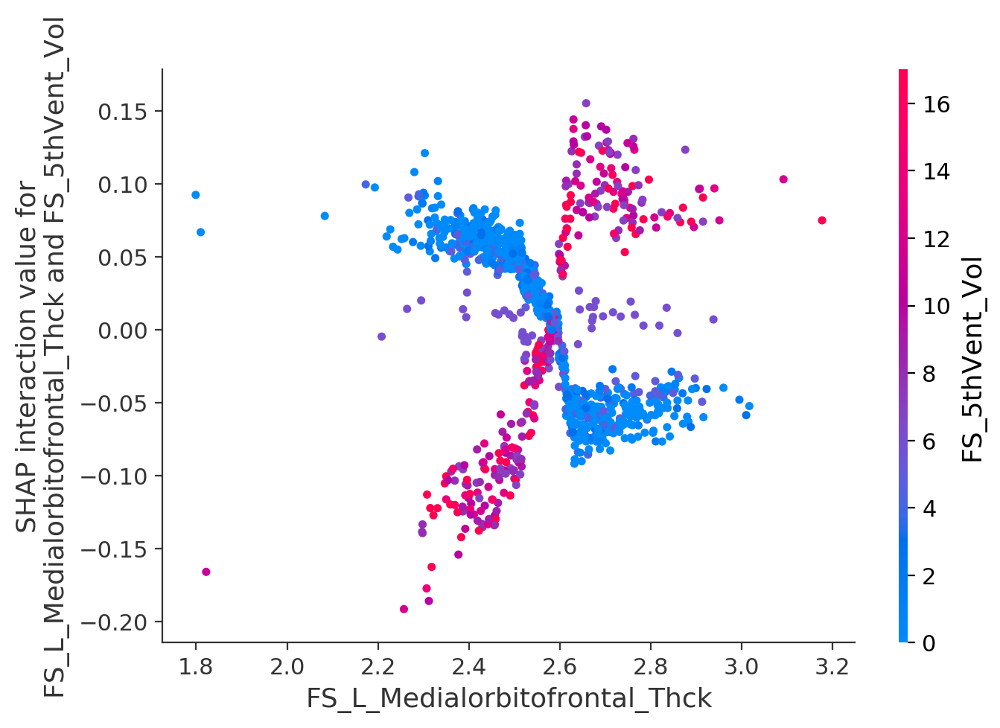

In [45]:
shap.dependence_plot(
    ('FS_L_Medialorbitofrontal_Thck', 'FS_5thVent_Vol'),
    shap_interaction_values, 
    X
)